In [1]:

import torch
import scanpy as sc
import pandas as pd
import scipy.sparse as sp
import h5py
import numpy as np
import matplotlib.pyplot as plt
import scvi
from skmisc.loess import loess
import seaborn as sns
from scvi.model import SCVI
#import torchmetrics
#import pytorch_lightning

C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\utils.py:434: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\utils.py:434: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\utils.py:434: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\utils.py:434: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\utils.py:434: FutureWarning: Importing read_mtx from `annda

In [2]:
## Read function
import scanpy as sc
import os
import re
import pandas as pd

DATA_DIR = "E:/thesis-folder/scRNAseq/data"
GENOME = "GRCh38-1.2.0_premrna"  # This is the HDF5 group created by cellranger count

brain_region_map = {
    'EC': 'Entorhinal cortex',
    'SFG': 'Superior frontal gyrus',
}

def parse_filename(filename):
    base_name = filename.split('.')[0]
    parts = base_name.split('_')
    sample_id = parts[0]
    match = re.match(r'([A-Za-z]+)(\d+)', parts[1])
    if match:
        region_code = match.group(1)
        donor_id = match.group(2)
        region_name = brain_region_map.get(region_code, region_code)
    else:
        region_code = donor_id = region_name = None
    return {
        'filename': filename,
        'sample_id': sample_id,
        'donor_id': donor_id,
        'region_code': region_code,
        'region_name': region_name
    }

def load_all_h5_files(data_dir, genome, keep_region='EC'):
    filenames = [f for f in os.listdir(data_dir) if f.endswith('.h5')]
    metadata = [parse_filename(f) for f in filenames]
    df = pd.DataFrame(metadata)
    adata_dict = {}
    adatas = []

    for _, row in df.iterrows():
        if row['region_code'] != keep_region:
            continue

        fpath = os.path.join(data_dir, row['filename'])
        print(f"📥 Loading: {row['sample_id']} from {fpath}")
        try:
            adata = sc.read_10x_h5(fpath, genome=genome).copy()
            adata.var_names_make_unique()

            #drop empty barcodes
            adata = adata[adata.X.sum(axis=1) > 0].copy()

            # 🔧 Make cell barcodes unique per sample
            adata.obs_names = [f"{bc}_{row['sample_id']}" for bc in adata.obs_names]

            adata.obs['sample_id'] = row['sample_id']
            adata.obs['donor_id'] = row['donor_id']
            adata.obs['region'] = row['region_name']

            adata_dict[row['sample_id']] = adata
            adatas.append(adata)
            print(f"✅ {row['sample_id']} loaded: {adata.shape[0]} cells")

        except Exception as e:
            print(f"❌ Failed to load {row['sample_id']}: {e}")

    return adatas, adata_dict, df


In [3]:
adatas, adata_dict, df_metadata = load_all_h5_files(DATA_DIR, GENOME, keep_region='EC')


📥 Loading: GSM4432645 from E:/thesis-folder/scRNAseq/data\GSM4432645_EC2_raw_gene_bc_matrices_h5.h5


C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


✅ GSM4432645 loaded: 391363 cells
📥 Loading: GSM4432646 from E:/thesis-folder/scRNAseq/data\GSM4432646_EC1_raw_gene_bc_matrices_h5.h5


C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


✅ GSM4432646 loaded: 507672 cells
📥 Loading: GSM4432647 from E:/thesis-folder/scRNAseq/data\GSM4432647_EC3_raw_gene_bc_matrices_h5.h5


C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


✅ GSM4432647 loaded: 356892 cells
📥 Loading: GSM4432648 from E:/thesis-folder/scRNAseq/data\GSM4432648_EC4_raw_gene_bc_matrices_h5.h5


C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


✅ GSM4432648 loaded: 381419 cells
📥 Loading: GSM4432649 from E:/thesis-folder/scRNAseq/data\GSM4432649_EC6_raw_gene_bc_matrices_h5.h5


C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


✅ GSM4432649 loaded: 415286 cells
📥 Loading: GSM4432650 from E:/thesis-folder/scRNAseq/data\GSM4432650_EC7_raw_gene_bc_matrices_h5.h5


C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


✅ GSM4432650 loaded: 398422 cells
📥 Loading: GSM4432651 from E:/thesis-folder/scRNAseq/data\GSM4432651_EC5_raw_gene_bc_matrices_h5.h5


C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


✅ GSM4432651 loaded: 343133 cells
📥 Loading: GSM4432652 from E:/thesis-folder/scRNAseq/data\GSM4432652_EC9_raw_gene_bc_matrices_h5.h5


C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


✅ GSM4432652 loaded: 411191 cells
📥 Loading: GSM4432653 from E:/thesis-folder/scRNAseq/data\GSM4432653_EC8_raw_gene_bc_matrices_h5.h5


C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


✅ GSM4432653 loaded: 409664 cells
📥 Loading: GSM4432654 from E:/thesis-folder/scRNAseq/data\GSM4432654_EC10_raw_gene_bc_matrices_h5.h5


C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


✅ GSM4432654 loaded: 430356 cells


In [4]:
sample_to_metadata = {
    'GSM4432654': {
        'brain_region': 'Entorhinal cortex',
        'batch': 'D',
        'donor_id': 10,
        'braak_stage': 6,
        'sex': 'Male',
        'age': 82
    },
    'GSM4432653': {
        'brain_region': 'Entorhinal cortex',
        'batch': 'B',
        'donor_id': 8,
        'braak_stage': 6,
        'sex': 'Male',
        'age': 72
    },
    'GSM4432652': {
        'brain_region': 'Entorhinal cortex',
        'batch': 'B',
        'donor_id': 9,
        'braak_stage': 6,
        'sex': 'Male',
        'age': 82
    },
    'GSM4432651': {
        'brain_region': 'Entorhinal cortex',
        'batch': 'B',
        'donor_id': 5,
        'braak_stage': 2,
        'sex': 'Male',
        'age': 77
    },
    'GSM4432650': {
        'brain_region': 'Entorhinal cortex',
        'batch': 'D',
        'donor_id': 7,
        'braak_stage': 2,
        'sex': 'Male',
        'age': 91
    },
    'GSM4432649': {
        'brain_region': 'Entorhinal cortex',
        'batch': 'D',
        'donor_id': 6,
        'braak_stage': 2,
        'sex': 'Male',
        'age': 87
    },
    'GSM4432648': {
        'brain_region': 'Entorhinal cortex',
        'batch': 'C',
        'donor_id': 4,
        'braak_stage': 2,
        'sex': 'Male',
        'age': 72
    },
    'GSM4432647': {
        'brain_region': 'Entorhinal cortex',
        'batch': 'C',
        'donor_id': 3,
        'braak_stage': 0,
        'sex': 'Male',
        'age': 71
    },
    'GSM4432646': {
        'brain_region': 'Entorhinal cortex',
        'batch': 'C',
        'donor_id': 1,
        'braak_stage': 0,
        'sex': 'Male',
        'age': 50
    },
    'GSM4432645': {
        'brain_region': 'Entorhinal cortex',
        'batch': 'C',
        'donor_id': 2,
        'braak_stage': 0,
        'sex': 'Male',
        'age': 60
    }
}
import pandas as pd

# Convert metadata dict to DataFrame
metadata_df = pd.DataFrame.from_dict(sample_to_metadata, orient='index')
metadata_df.index.name = 'sample_id'

for adata in adatas:
    if 'sample_id' not in adata.obs:
        raise KeyError("adata.obs must contain a 'sample_id' column")

    # Drop any overlapping columns before merging
    overlapping_cols = metadata_df.columns.intersection(adata.obs.columns)
    adata.obs.drop(columns=overlapping_cols, inplace=True)

    # Merge metadata cleanly
    adata.obs = adata.obs.merge(metadata_df, how='left', left_on='sample_id', right_index=True)


In [5]:
adatas

[AnnData object with n_obs × n_vars = 391363 × 33694
     obs: 'sample_id', 'region', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age'
     var: 'gene_ids',
 AnnData object with n_obs × n_vars = 507672 × 33694
     obs: 'sample_id', 'region', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age'
     var: 'gene_ids',
 AnnData object with n_obs × n_vars = 356892 × 33694
     obs: 'sample_id', 'region', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age'
     var: 'gene_ids',
 AnnData object with n_obs × n_vars = 381419 × 33694
     obs: 'sample_id', 'region', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age'
     var: 'gene_ids',
 AnnData object with n_obs × n_vars = 415286 × 33694
     obs: 'sample_id', 'region', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age'
     var: 'gene_ids',
 AnnData object with n_obs × n_vars = 398422 × 33694
     obs: 'sample_id', 'region', 'brain_region', 'batch', 'donor_id', 'braak_stage

In [87]:
import anndata as ad
adata_all = ad.concat(
    adatas,
    label="sample_id",
    keys=[a.obs["sample_id"].iloc[0] for a in adatas],
    index_unique=None,
    merge="same"          # <- keeps a column only if every value matches
)


In [89]:
#This prevents barcode collisions when merging AnnData objects — otherwise, two samples might both have AAACGGGTCG and get confused.
for adata in adatas:
    sample_id = adata.obs["sample_id"].iloc[0]  # Use .iloc[] for positional indexing
    adata.obs_names = [f"{sample_id}_{cell}" for cell in adata.obs_names]
    adata.var_names_make_unique()

In [90]:
dupes = adata_all.obs_names.duplicated().sum()
print(f"🔎 duplicated barcodes: {dupes}")

🔎 duplicated barcodes: 0


In [91]:
for ad in adatas:
    ad.var = pd.DataFrame(ad.var.copy())  # ensure it's a full DataFrame


In [67]:
del adata_all.obs["region"]


In [92]:
adata_all


AnnData object with n_obs × n_vars = 4045398 × 33694
    obs: 'sample_id', 'region', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age'
    var: 'gene_ids'

In [93]:
ad = adatas[0]
print(ad.var.columns)
print(ad.var.head())
print(ad.var.dtypes)


Index(['gene_ids'], dtype='object')
                     gene_ids
RP11-34P13.3  ENSG00000243485
FAM138A       ENSG00000237613
OR4F5         ENSG00000186092
RP11-34P13.7  ENSG00000238009
RP11-34P13.8  ENSG00000239945
gene_ids    object
dtype: object


In [83]:
print(adata_all.var.columns)
print(adata_all.var.head())


Index([], dtype='object')
Empty DataFrame
Columns: []
Index: [RP11-34P13.3, FAM138A, OR4F5, RP11-34P13.7, RP11-34P13.8]


In [79]:
adata_all

AnnData object with n_obs × n_vars = 4045398 × 33694
    obs: 'sample_id', 'region', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age'

In [42]:
print(adata_all.raw is not None)
# FALSE == NO RAW SAVED (YET)

False


In [80]:
adata_all.shape

(4045398, 33694)

In [81]:
adata_all.obs


,sample_id,region,brain_region,batch,donor_id,braak_stage,sex,age
GSM4432645_GSM4432645_AAACCTGAGAAACCAT-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60
GSM4432645_GSM4432645_AAACCTGAGAAACCTA-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60
GSM4432645_GSM4432645_AAACCTGAGAAACGAG-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60
GSM4432645_GSM4432645_AAACCTGAGAAACGCC-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60
GSM4432645_GSM4432645_AAACCTGAGAACAACT-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60
...,...,...,...,...,...,...,...,...
GSM4432654_GSM4432654_TTTGTCATCTTGCCGT-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82
GSM4432654_GSM4432654_TTTGTCATCTTGGGTA-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82
GSM4432654_GSM4432654_TTTGTCATCTTGTTTG-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82
GSM4432654_GSM4432654_TTTGTCATCTTTAGGG-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82


In [94]:
adata_all.var

,gene_ids
RP11-34P13.3,ENSG00000243485
FAM138A,ENSG00000237613
OR4F5,ENSG00000186092
RP11-34P13.7,ENSG00000238009
RP11-34P13.8,ENSG00000239945
...,...
AC233755.2,ENSG00000277856
AC233755.1,ENSG00000275063
AC240274.1,ENSG00000271254
AC213203.1,ENSG00000277475


## Thesis-before doing filtering i need to justify 

In [95]:
# 1️⃣  Make sure a Boolean mito mask exists
if 'mt' not in adata_all.var.columns or adata_all.var['mt'].sum() == 0:
    adata_all.var['mt'] = adata_all.var_names.str.startswith('MT-')    # 13 hits expected

# 2️⃣  Make sure per-cell QC metrics have been computed AFTER the mask exists
sc.pp.calculate_qc_metrics(
    adata_all,
    qc_vars=['mt'],       # tells Scanpy to create pct_counts_mt
    percent_top=None,
    log1p=False,
    inplace=True)


In [96]:
print('pct_counts_mt' in adata_all.obs.columns)   # should be True
print(adata_all.obs[['n_genes_by_counts', 'pct_counts_mt']].head())


True
                                                    n_genes_by_counts  \
GSM4432645_GSM4432645_AAACCTGAGAAACCAT-1_GSM443...                  4   
GSM4432645_GSM4432645_AAACCTGAGAAACCTA-1_GSM443...                 55   
GSM4432645_GSM4432645_AAACCTGAGAAACGAG-1_GSM443...                  3   
GSM4432645_GSM4432645_AAACCTGAGAAACGCC-1_GSM443...                 41   
GSM4432645_GSM4432645_AAACCTGAGAACAACT-1_GSM443...                 62   

                                                    pct_counts_mt  
GSM4432645_GSM4432645_AAACCTGAGAAACCAT-1_GSM443...       0.000000  
GSM4432645_GSM4432645_AAACCTGAGAAACCTA-1_GSM443...       5.357143  
GSM4432645_GSM4432645_AAACCTGAGAAACGAG-1_GSM443...       0.000000  
GSM4432645_GSM4432645_AAACCTGAGAAACGCC-1_GSM443...       0.000000  
GSM4432645_GSM4432645_AAACCTGAGAACAACT-1_GSM443...      19.736843  


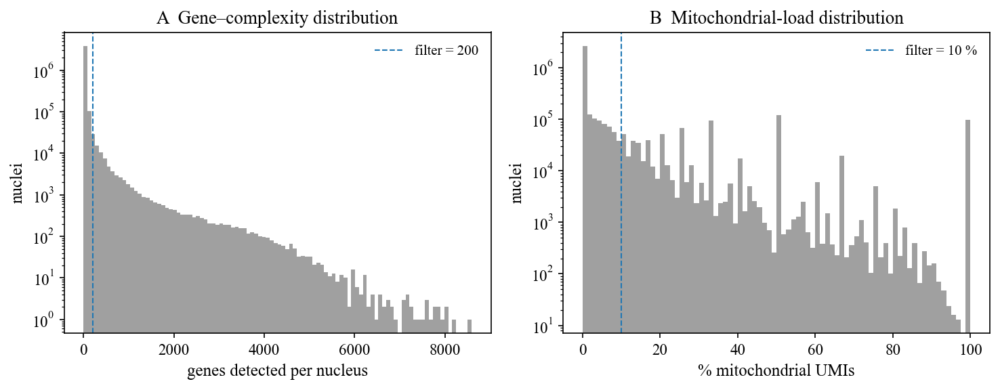

In [98]:
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import numpy as np

# --- make sure QC columns exist ---
if 'n_genes_by_counts' not in adata_all.obs.columns or 'pct_counts_mt' not in adata_all.obs.columns:
    adata_all.var['mt'] = adata_all.var_names.str.startswith('MT-')
    sc.pp.calculate_qc_metrics(adata_all, qc_vars=['mt'], inplace=True)

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=150)

# Panel A – genes per nucleus (draw linear y first)
sns.histplot(
    adata_all.obs["n_genes_by_counts"],
    bins=100,
    ax=axes[0],
    color="grey", edgecolor=None
)
axes[0].axvline(200, ls="--", lw=1, label="filter = 200")
axes[0].set_xlabel("genes detected per nucleus")
axes[0].set_ylabel("nuclei")
axes[0].set_title("A  Gene–complexity distribution")
axes[0].set_yscale('log', nonpositive='clip')   # <- new
axes[0].legend(frameon=False)

# Panel B – % mito
sns.histplot(
    adata_all.obs["pct_counts_mt"],
    bins=80,
    ax=axes[1],
    color="grey", edgecolor=None
)
axes[1].axvline(10, ls="--", lw=1, label="filter = 10 %")
axes[1].set_xlabel("% mitochondrial UMIs")
axes[1].set_ylabel("nuclei")
axes[1].set_title("B  Mitochondrial‐load distribution")
axes[1].set_yscale('log', nonpositive='clip')   # <- new
axes[1].legend(frameon=False)

plt.tight_layout()
plt.savefig("qc_gene_mito_histograms.pdf")   # now works
plt.savefig("qc_gene_mito_histograms.png", dpi=300)
plt.show()


In [99]:
print("Shape =", adata_all.shape)          # (n_cells, n_genes)


Shape = (4045398, 33694)


In [100]:
print(adata_all.obs[['n_genes_by_counts', 'pct_counts_mt']].head())


                                                    n_genes_by_counts  \
GSM4432645_GSM4432645_AAACCTGAGAAACCAT-1_GSM443...                  4   
GSM4432645_GSM4432645_AAACCTGAGAAACCTA-1_GSM443...                 55   
GSM4432645_GSM4432645_AAACCTGAGAAACGAG-1_GSM443...                  3   
GSM4432645_GSM4432645_AAACCTGAGAAACGCC-1_GSM443...                 41   
GSM4432645_GSM4432645_AAACCTGAGAACAACT-1_GSM443...                 62   

                                                    pct_counts_mt  
GSM4432645_GSM4432645_AAACCTGAGAAACCAT-1_GSM443...       0.000000  
GSM4432645_GSM4432645_AAACCTGAGAAACCTA-1_GSM443...       5.357143  
GSM4432645_GSM4432645_AAACCTGAGAAACGAG-1_GSM443...       0.000000  
GSM4432645_GSM4432645_AAACCTGAGAAACGCC-1_GSM443...       0.000000  
GSM4432645_GSM4432645_AAACCTGAGAACAACT-1_GSM443...      19.736843  


In [101]:
# identify mito genes: anything starting with 'MT-' in GRCh38 / 'mt-' in GRCm38
adata_all.var['mt'] = adata_all.var_names.str.startswith(('MT-', 'mt-'))
sc.pp.calculate_qc_metrics(adata_all, qc_vars=['mt'], inplace=True)
pct_mito = adata_all.obs['pct_counts_mt']


In [22]:
adata_all.obs

,sample_id,brain_region,batch,donor_id,braak_stage,sex,age,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,log1p_total_counts_mt
GSM4432645_AAACCTGAGAAACCAT-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,4,4.0,0.0,0.000000,1.609438,1.609438,100.000000,100.0,100.0,100.0,0.000000
GSM4432645_AAACCTGAGAAACCTA-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,55,56.0,3.0,5.357143,4.025352,4.043051,91.071429,100.0,100.0,100.0,1.386294
GSM4432645_AAACCTGAGAAACGAG-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,3,3.0,0.0,0.000000,1.386294,1.386294,100.000000,100.0,100.0,100.0,0.000000
GSM4432645_AAACCTGAGAAACGCC-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,41,42.0,0.0,0.000000,3.737670,3.761200,100.000000,100.0,100.0,100.0,0.000000
GSM4432645_AAACCTGAGAACAACT-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,62,76.0,15.0,19.736843,4.143135,4.343805,84.210526,100.0,100.0,100.0,2.772589
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM4432654_TTTGTCATCTTGCCGT-1_GSM4432654,GSM4432654,Entorhinal cortex,D,10,6,Male,82,1,1.0,0.0,0.000000,0.693147,0.693147,100.000000,100.0,100.0,100.0,0.000000
GSM4432654_TTTGTCATCTTGGGTA-1_GSM4432654,GSM4432654,Entorhinal cortex,D,10,6,Male,82,5,5.0,0.0,0.000000,1.791759,1.791759,100.000000,100.0,100.0,100.0,0.000000
GSM4432654_TTTGTCATCTTGTTTG-1_GSM4432654,GSM4432654,Entorhinal cortex,D,10,6,Male,82,13,13.0,3.0,23.076923,2.639057,2.639057,100.000000,100.0,100.0,100.0,1.386294
GSM4432654_TTTGTCATCTTTAGGG-1_GSM4432654,GSM4432654,Entorhinal cortex,D,10,6,Male,82,3,3.0,0.0,0.000000,1.386294,1.386294,100.000000,100.0,100.0,100.0,0.000000


In [102]:
adata_all.obs['pct_counts_mt']

GSM4432645_GSM4432645_AAACCTGAGAAACCAT-1_GSM4432645     0.000000
GSM4432645_GSM4432645_AAACCTGAGAAACCTA-1_GSM4432645     5.357143
GSM4432645_GSM4432645_AAACCTGAGAAACGAG-1_GSM4432645     0.000000
GSM4432645_GSM4432645_AAACCTGAGAAACGCC-1_GSM4432645     0.000000
GSM4432645_GSM4432645_AAACCTGAGAACAACT-1_GSM4432645    19.736843
                                                         ...    
GSM4432654_GSM4432654_TTTGTCATCTTGCCGT-1_GSM4432654     0.000000
GSM4432654_GSM4432654_TTTGTCATCTTGGGTA-1_GSM4432654     0.000000
GSM4432654_GSM4432654_TTTGTCATCTTGTTTG-1_GSM4432654    23.076923
GSM4432654_GSM4432654_TTTGTCATCTTTAGGG-1_GSM4432654     0.000000
GSM4432654_GSM4432654_TTTGTCATCTTTCCTC-1_GSM4432654     0.000000
Name: pct_counts_mt, Length: 4045398, dtype: float32

In [103]:
print(adata_all.var['mt'].sum())      # how many genes were marked mt?
print(pct_mito.describe())        # distribution


13
count    4.045398e+06
mean     8.396892e+00
std      1.961353e+01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      5.454545e+00
max      1.000000e+02
Name: pct_counts_mt, dtype: float64


## Delete all mito genes (only 13?)

In [42]:
adata_all.obs

,sample_id,brain_region,batch,donor_id,braak_stage,sex,age,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt
GSM4432645_AAACCTGAGAAACCAT-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,4,1.609438,4.0,1.609438,100.000000,100.0,100.0,100.0,0.0,0.000000,0.000000
GSM4432645_AAACCTGAGAAACCTA-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,55,4.025352,56.0,4.043051,91.071429,100.0,100.0,100.0,3.0,1.386294,5.357143
GSM4432645_AAACCTGAGAAACGAG-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,3,1.386294,3.0,1.386294,100.000000,100.0,100.0,100.0,0.0,0.000000,0.000000
GSM4432645_AAACCTGAGAAACGCC-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,41,3.737670,42.0,3.761200,100.000000,100.0,100.0,100.0,0.0,0.000000,0.000000
GSM4432645_AAACCTGAGAACAACT-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,62,4.143135,76.0,4.343805,84.210526,100.0,100.0,100.0,15.0,2.772589,19.736843
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM4432654_TTTGTCATCTTGCCGT-1_GSM4432654,GSM4432654,Entorhinal cortex,D,10,6,Male,82,1,0.693147,1.0,0.693147,100.000000,100.0,100.0,100.0,0.0,0.000000,0.000000
GSM4432654_TTTGTCATCTTGGGTA-1_GSM4432654,GSM4432654,Entorhinal cortex,D,10,6,Male,82,5,1.791759,5.0,1.791759,100.000000,100.0,100.0,100.0,0.0,0.000000,0.000000
GSM4432654_TTTGTCATCTTGTTTG-1_GSM4432654,GSM4432654,Entorhinal cortex,D,10,6,Male,82,13,2.639057,13.0,2.639057,100.000000,100.0,100.0,100.0,3.0,1.386294,23.076923
GSM4432654_TTTGTCATCTTTAGGG-1_GSM4432654,GSM4432654,Entorhinal cortex,D,10,6,Male,82,3,1.386294,3.0,1.386294,100.000000,100.0,100.0,100.0,0.0,0.000000,0.000000


Pre filtering 4045398 rows × 18 columns

In [104]:
sc.pp.filter_cells(adata_all, min_genes=200)

sc.pp.filter_genes(adata_all, min_cells=10)

adata_all.var['mt'] = adata_all.var_names.str.startswith('MT-')

sc.pp.calculate_qc_metrics(adata_all, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

# Filter based on gene count and mitochondrial content
adata_all = adata_all[adata_all.obs['n_genes_by_counts'] > 200, :]
adata_all

View of AnnData object with n_obs × n_vars = 83265 × 26147
    obs: 'sample_id', 'region', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'log1p_total_counts_mt', 'n_genes'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_mean_counts', 'log1p_total_counts', 'n_cells'

83265 × 26147 μετα απο gene k cells filtering

In [105]:

adata_all = adata_all[adata_all.obs['pct_counts_mt'] < 10, :]


In [106]:
adata_all.shape

(74453, 26147)

74453, 26147 μετα απο mito filtering


After quality control filtering based on gene count thresholds and mitochondrial RNA content, the dataset was reduced from ~4 million barcodes to ~74,000 high-quality nuclei. This level of reduction is expected in single-nucleus RNA-seq data, where the majority of barcodes in the raw count matrix correspond to empty droplets or background noise

In [107]:
adata_all.raw = adata_all.copy() # saving raw (for differentia lexpression later )


In [108]:
print(adata_all.raw.var.head())
print(adata_all.raw.var.columns)


                      gene_ids     mt  n_cells_by_counts  mean_counts  \
RP11-34P13.7   ENSG00000238009  False                336     0.004064   
FO538757.2     ENSG00000279457  False               8310     0.118416   
AP006222.2     ENSG00000228463  False               1789     0.022722   
RP4-669L17.10  ENSG00000237094  False                712     0.008881   
RP5-857K21.4   ENSG00000230021  False              13117     0.226731   

               pct_dropout_by_counts  total_counts  log1p_mean_counts  \
RP11-34P13.7               99.598389         340.0           0.000104   
FO538757.2                 90.067294        9907.0           0.004658   
AP006222.2                 97.861659        1901.0           0.000816   
RP4-669L17.10              99.148967         743.0           0.000245   
RP5-857K21.4               84.321624       18969.0           0.006836   

               log1p_total_counts  n_cells  
RP11-34P13.7             6.047372      336  
FO538757.2               9.84623

In [51]:
adata_all.obs

,sample_id,brain_region,batch,donor_id,braak_stage,sex,age,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,log1p_total_counts_mt,n_genes
GSM4432645_GSM4432645_AAACCTGAGGATGCGT-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,4620,11301.0,850.0,7.521458,8.438366,9.332735,19.653128,25.546412,32.952836,46.243695,6.746412,4620
GSM4432645_GSM4432645_AAACCTGAGTCAATAG-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,2562,4558.0,17.0,0.372971,7.848934,8.424859,19.197016,25.756911,34.510750,49.846424,2.890372,2562
GSM4432645_GSM4432645_AAACCTGCAAGTAGTA-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,484,634.0,42.0,6.624606,6.184149,6.453625,29.179811,39.432177,55.205047,100.000000,3.761200,484
GSM4432645_GSM4432645_AAACCTGCAGACGTAG-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,244,305.0,21.0,6.885246,5.501258,5.723585,36.393443,52.786885,85.573770,100.000000,3.091043,244
GSM4432645_GSM4432645_AAACCTGCATACTCTT-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,3068,6162.0,193.0,3.132100,8.029433,8.726481,18.822002,25.799124,34.252799,50.024339,5.267858,3069
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM4432654_GSM4432654_TTTGTCATCCACGTGG-1_GSM4432654,GSM4432654,Entorhinal cortex,D,10,6,Male,82,292,363.0,5.0,1.377410,5.680173,5.897154,33.333333,47.107438,74.655647,100.000000,1.791759,292
GSM4432654_GSM4432654_TTTGTCATCGCGGATC-1_GSM4432654,GSM4432654,Entorhinal cortex,D,10,6,Male,82,498,698.0,3.0,0.429799,6.212606,6.549651,33.524355,42.979943,57.306590,100.000000,1.386294,498
GSM4432654_GSM4432654_TTTGTCATCTATCGCC-1_GSM4432654,GSM4432654,Entorhinal cortex,D,10,6,Male,82,392,443.0,6.0,1.354402,5.976351,6.098074,22.747748,34.009009,56.531532,100.000000,1.945910,393
GSM4432654_GSM4432654_TTTGTCATCTCGCTTG-1_GSM4432654,GSM4432654,Entorhinal cortex,D,10,6,Male,82,470,600.0,40.0,6.666667,6.154858,6.398595,27.166667,38.333333,55.000000,100.000000,3.713572,470


In [111]:
# UPDATED SAVE
# Faster but larger file (no compression)
adata_all.write_h5ad("updated_adata_all_rawCounts.h5ad")



## UPDATED: SCVI SOLO

In [144]:
#!/usr/bin/env python
"""
solo_doublet_detection.py
----------------------------------
• Expects  adata_all_rawCounts.h5ad  (raw counts in .X or layers["counts"])
• Adds   solo_doublet_prob   and   solo_doublet   columns to .obs
• Saves   adata_with_solo.h5ad
"""

import os, random, numpy as np, torch, scanpy as sc, pandas as pd
import scvi

# ---------------------------------------------------------------------
# 0 – Reproducibility & single-threaded BLAS
# ---------------------------------------------------------------------
os.environ["PYTHONHASHSEED"] = "0"
os.environ["OMP_NUM_THREADS"] = "1"          # deterministic BLAS
SEED = 42
np.random.seed(SEED)
random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# ---------------------------------------------------------------------
# 1 – Load AnnData
# ---------------------------------------------------------------------
adata = sc.read_h5ad("updated_adata_all_rawCounts.h5ad")
print("Loaded:", adata)

# Decide where raw counts live
counts_layer = "counts" if "counts" in adata.layers else None

# ---------------------------------------------------------------------
# 2 – Run SOLO per sample_id
# ---------------------------------------------------------------------
results = []
device_label = "gpu" if torch.cuda.is_available() else "cpu"
print("Using accelerator:", device_label.upper())

for sid in adata.obs["sample_id"].unique():
    print(f"🚀  Processing sample {sid}")

    ad = adata[adata.obs["sample_id"] == sid].copy()

    # SCVI setup
    scvi.model.SCVI.setup_anndata(ad, layer=counts_layer, batch_key=None)
    vae = scvi.model.SCVI(ad, n_layers=2, n_hidden=128)
    vae.train(accelerator=device_label, devices=1,
              max_epochs=25, batch_size=256, load_sparse_tensor=True, check_val_every_n_epoch=5)

    # SOLO
    solo = scvi.external.SOLO.from_scvi_model(vae)
    solo.train(accelerator=device_label, devices=1,
               max_epochs=25, batch_size=1024)

    # SOLO outputs -------------------------------------------------
    # after solo.train(...)
    # after solo.train(...)
    probs = solo.predict(soft=True)        # DataFrame: ['doublet_probability']
    calls = solo.predict(soft=False)       # DataFrame: ['prediction'] ('doublet'/'singlet')
    
    probs.index = ad.obs_names
    calls.index = ad.obs_names
    
    tidy = pd.concat(
        [probs["doublet_probability"].astype(float),
         calls["prediction"].astype(str)],
        axis=1
    )
    results.append(tidy)


Loaded: AnnData object with n_obs × n_vars = 74453 × 26147
    obs: 'sample_id', 'region', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'log1p_total_counts_mt', 'n_genes'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_mean_counts', 'log1p_total_counts', 'n_cells'
Using accelerator: GPU
🚀  Processing sample GSM4432645


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
`Trainer.fit` stopped: `max_epochs=25` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=25` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


KeyError: 'doublet_probability'

In [147]:
#!/usr/bin/env python
"""
solo_doublet_detection.py
------------------------------------------------------------
Detect doublets with SOLO on each sample_id.

INPUT  : updated_adata_all_rawCounts.h5ad
         – raw UMI counts in .X  (or layers["counts"] if present)

OUTPUT : updated_adata_with_solo.h5ad
         – adds solo_doublet_prob (float)  and solo_doublet (str) in .obs
"""

# ------------------------ basic imports ------------------------------
import os, random, numpy as np, pandas as pd, torch, scanpy as sc, scvi
from scvi.external import SOLO

# ------------------------ reproducibility ----------------------------
os.environ["PYTHONHASHSEED"] = "0"
os.environ["OMP_NUM_THREADS"] = "1"
SEED = 42
np.random.seed(SEED)
random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# ------------------------ load data ----------------------------------
adata = sc.read_h5ad("updated_adata_all_rawCounts.h5ad")
counts_layer = "counts" if "counts" in adata.layers else None
device = "gpu" if torch.cuda.is_available() else "cpu"
print("scvi-tools", scvi.__version__,
      "| counts layer:", counts_layer or ".X",
      "| device:", device.upper())

# ------------------------ loop over samples --------------------------
results = []

for sid in adata.obs["sample_id"].unique():
    print(f"\n🚀  Sample {sid}")

    ad = adata[adata.obs["sample_id"] == sid].copy()

    # ---- SCVI VAE ----------------------------------------------------
    scvi.model.SCVI.setup_anndata(ad, layer=counts_layer, batch_key=None)
    vae = scvi.model.SCVI(ad, n_layers=2, n_hidden=128, n_latent=30)
    vae.train(
        accelerator=device,
        devices=1,
        max_epochs=25,
        batch_size=256,              # keep memory frugal
        load_sparse_tensor=True,     # avoid dense *.toarray()
        check_val_every_n_epoch=5,
    )

    # ---- SOLO -------------------------------------------------------
    solo = SOLO.from_scvi_model(vae)
    solo.train(
        accelerator=device,
        devices=1,
        max_epochs=25,
        batch_size=256,
    )

    # ---- Probabilities & calls -------------------------------------
    probs_df = solo.predict(soft=True)        # logits OR probabilities
    probs_df.index = ad.obs_names

    # detect prob column automatically
    prob_col = next(
        (c for c in probs_df.columns if "doublet" in c and "prob" in c),
        None,
    ) or next(  # fallback: first col starting with "doublet"
        (c for c in probs_df.columns if c.startswith("doublet")),
        None,
    )
    if prob_col is None:
        raise RuntimeError(f"No doublet-prob column in {list(probs_df.columns)}")

    # hard calls use SOLO’s calibrated threshold internally
    calls = solo.predict(soft=False)
    if isinstance(calls, pd.DataFrame):
        calls = calls.iloc[:, 0]
    calls.index = ad.obs_names
    calls.name  = "prediction"

    # sigmoid conversion if values are logits (pre-1.1.3)
    if probs_df[prob_col].max() > 1.0:
        probs_df[prob_col] = 1 / (1 + np.exp(-probs_df[prob_col].values))

    tidy = pd.DataFrame(
        {
            "doublet_probability": probs_df[prob_col].astype(float),
            "prediction": calls.astype(str),
        },
        index=ad.obs_names,
    )
    results.append(tidy)

# ------------------------ merge & save --------------------------------
preds_all = pd.concat(results)
adata.obs["solo_doublet_prob"] = preds_all.loc[adata.obs_names, "doublet_probability"]
adata.obs["solo_doublet"]      = preds_all.loc[adata.obs_names, "prediction"]

print("\nOverall doublet rate:",
      (adata.obs['solo_doublet'] == 'doublet').mean() * 100, "%")

adata.write_h5ad("updated_adata_with_solo.h5ad", compression="gzip")
print("✅  Saved → updated_adata_with_solo.h5ad")


scvi-tools 1.3.0 | counts layer: .X | device: GPU

🚀  Sample GSM4432645


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
`Trainer.fit` stopped: `max_epochs=25` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=25` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)



🚀  Sample GSM4432646


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
`Trainer.fit` stopped: `max_epochs=25` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=25` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
GPU available: True (cuda), used: True



🚀  Sample GSM4432647


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
`Trainer.fit` stopped: `max_epochs=25` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=25` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)



🚀  Sample GSM4432648


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
`Trainer.fit` stopped: `max_epochs=25` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=25` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
GPU available: True (cuda), used: True



🚀  Sample GSM4432649


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
`Trainer.fit` stopped: `max_epochs=25` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=25` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)



🚀  Sample GSM4432650


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
`Trainer.fit` stopped: `max_epochs=25` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=25` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



🚀  Sample GSM4432651


C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
`Trainer.fit` stopped: `max_epochs=25` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=25` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)



🚀  Sample GSM4432652


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
`Trainer.fit` stopped: `max_epochs=25` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=25` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)



🚀  Sample GSM4432653


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
`Trainer.fit` stopped: `max_epochs=25` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=25` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)



🚀  Sample GSM4432654


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
`Trainer.fit` stopped: `max_epochs=25` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/25 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=25` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)



Overall doublet rate: 27.82157871408808 %
✅  Saved → updated_adata_with_solo.h5ad


In [142]:
probs

,doublet,singlet
GSM4432654_GSM4432654_AAACCTGAGCCCGAAA-1_GSM4432654,0.406790,0.593210
GSM4432654_GSM4432654_AAACCTGAGCCGCCTA-1_GSM4432654,0.515221,0.484779
GSM4432654_GSM4432654_AAACCTGAGCGTAATA-1_GSM4432654,0.278989,0.721011
GSM4432654_GSM4432654_AAACCTGAGTGACATA-1_GSM4432654,0.492490,0.507510
GSM4432654_GSM4432654_AAACCTGCACAGGCCT-1_GSM4432654,0.891861,0.108139
...,...,...
GSM4432654_GSM4432654_TTTGTCATCCACGTGG-1_GSM4432654,0.094701,0.905299
GSM4432654_GSM4432654_TTTGTCATCGCGGATC-1_GSM4432654,0.597791,0.402209
GSM4432654_GSM4432654_TTTGTCATCTATCGCC-1_GSM4432654,0.039340,0.960660
GSM4432654_GSM4432654_TTTGTCATCTCGCTTG-1_GSM4432654,0.524498,0.475502


In [139]:
import scvi, importlib, sys, os
print("scvi-tools version inside script  ➜", scvi.__version__)
print("imported from                   ➜", scvi.__file__)


scvi-tools version inside script  ➜ 1.3.0
imported from                   ➜ C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\scvi\__init__.py


In [136]:
import scanpy as sc
import pandas as pd

adata = sc.read_h5ad("updated_adata_with_solo.h5ad")

# overall singlet / doublet counts
overall = adata.obs["solo_doublet"].value_counts()
print("\nOverall singlets / doublets:")
print(overall)

# per-sample counts and doublet rate
per_sample = (
    adata.obs
    .groupby(["sample_id", "solo_doublet"])
    .size()
    .unstack(fill_value=0)
)
per_sample["doublet_rate_%"] = (
    per_sample["doublet"] / per_sample.sum(axis=1) * 100
).round(2)

print("\nPer-sample summary:")
print(per_sample)



Overall singlets / doublets:
solo_doublet
singlet    42502
doublet    31951
Name: count, dtype: int64

Per-sample summary:
solo_doublet  doublet  singlet  doublet_rate_%
sample_id                                     
GSM4432645       3104     2892           51.77
GSM4432646       3455     6214           35.73
GSM4432647       1763     1005           63.69
GSM4432648       3084     2341           56.85
GSM4432649       3049     2175           58.37
GSM4432650       3126     5013           38.41
GSM4432651       3552      681           83.91
GSM4432652       3437     9186           27.23
GSM4432653       3154     8049           28.15
GSM4432654       4227     4946           46.08


C:\Users\D_F\AppData\Local\Temp\ipykernel_10212\3623587716.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(["sample_id", "solo_doublet"])


## 🧠 In Thesis Language

    Raw gene expression counts were preserved using the .raw attribute of the AnnData object prior to normalization and log transformation. This allowed for downstream visualization and marker gene evaluation using untransformed data, while ensuring that clustering and dimensionality reduction were based on normalized, log-transformed expression matrices.

In [52]:
# storing raw in counts
adata_all.layers["counts"] = adata_all.raw.X.copy()

---
## havent run this yet ( normalize / log transform)

---

In [59]:
import scanpy as sc
import numpy as np
import random
import os

# Set reproducibility settings
os.environ["PYTHONHASHSEED"] = "0"
np.random.seed(42)
random.seed(42)


sc.pp.highly_variable_genes(
        adata_all,
        n_top_genes=3000,
        flavor="seurat_v3",
        batch_key="sample_id",
        layer="counts",
        inplace=True)
adata_all = adata_all[:, adata_all.var.highly_variable].copy()


In [54]:

# Normalize total counts per cell to 10,000
sc.pp.normalize_total(adata_all, target_sum=1e4)

# Log-transform
sc.pp.log1p(adata_all)


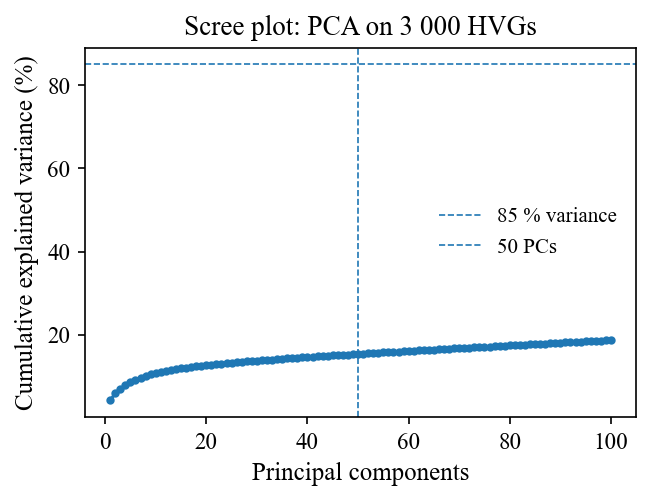

Variance explained by 50 PCs: 15.4%


In [60]:
# 1️⃣  Standardise each gene (mean-0, var-1) to equalise influence
sc.pp.scale(adata_all, max_value=10)   # clip extreme values

# 2️⃣  Principal-component analysis on the HVGs
sc.pp.pca(adata_all, n_comps=100)      # compute up to 100 PCs

# 3️⃣  Scree plot to justify keeping the selected number of PCs
import matplotlib.pyplot as plt, numpy as np

var_ratio  = adata_all.uns['pca']['variance_ratio']
cumulative = np.cumsum(var_ratio) * 100

plt.figure(figsize=(4.5,3.5), dpi=150)
plt.plot(range(1, len(cumulative)+1), cumulative, marker='.')
plt.axhline(85, ls='--', lw=0.8, label='85 % variance')
plt.axvline(50, ls='--', lw=0.8, label='50 PCs')
plt.xlabel('Principal components')
plt.ylabel('Cumulative explained variance (%)')
plt.title('Scree plot: PCA on 3 000 HVGs')
plt.legend(frameon=False)
plt.tight_layout()
plt.savefig('SuppFig_PCA_scree.pdf')
plt.show()

print(f'Variance explained by 50 PCs: {cumulative[49]:.1f}%')


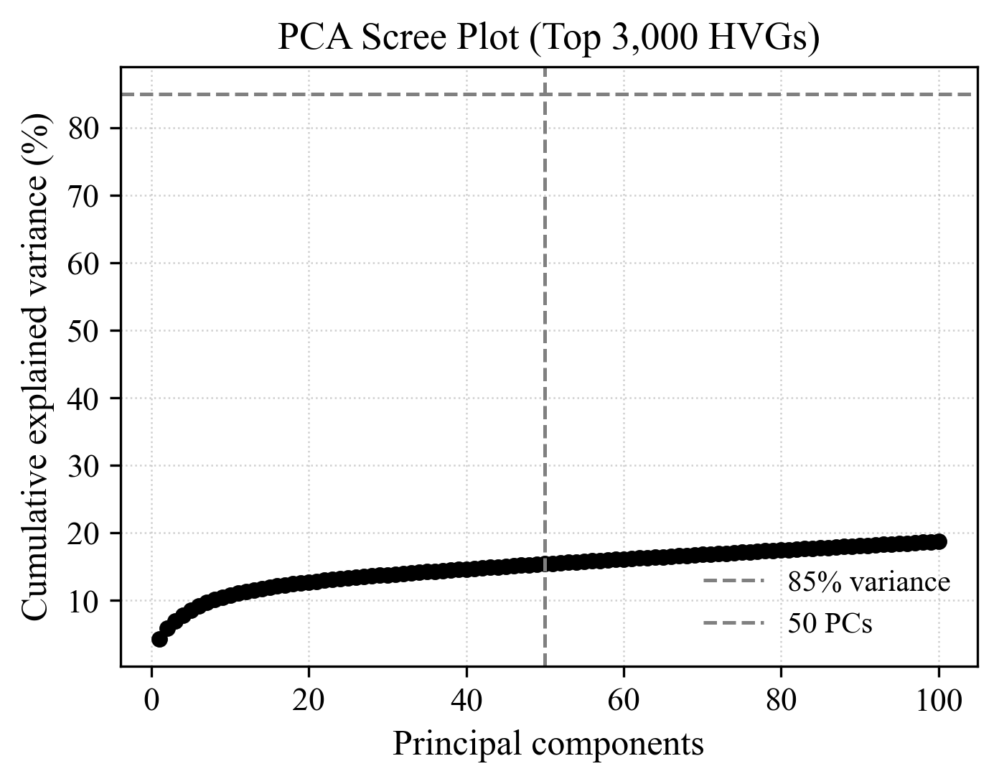

Variance explained by 50 PCs: 15.4%


In [61]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl

# Use a serif font for professional appearance
mpl.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "font.size": 12,
    "axes.labelsize": 12,
    "axes.titlesize": 13,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
    "legend.fontsize": 10,
    "pdf.fonttype": 42  # ensures text is editable in Illustrator
})

# Compute cumulative explained variance
var_ratio  = adata_all.uns['pca']['variance_ratio']
cumulative = np.cumsum(var_ratio) * 100

# Create figure
fig, ax = plt.subplots(figsize=(4.8, 3.8), dpi=300)

# Scree plot line
ax.plot(
    range(1, len(cumulative)+1),
    cumulative,
    marker='o',
    linestyle='-',
    linewidth=1.8,
    markersize=4.5,
    color='black'
)

# Reference lines
ax.axhline(85, color='gray', linestyle='--', linewidth=1.2, label='85% variance')
ax.axvline(50, color='gray', linestyle='--', linewidth=1.2, label='50 PCs')

# Labels and title
ax.set_xlabel('Principal components')
ax.set_ylabel('Cumulative explained variance (%)')
ax.set_title('PCA Scree Plot (Top 3,000 HVGs)')

# Grid and legend
ax.grid(True, linestyle=':', linewidth=0.6, alpha=0.6)
ax.legend(frameon=False, loc='lower right')

# Layout and save as high-res PDF
plt.tight_layout()
plt.savefig('SuppFig_PCA_scree.pdf', format='pdf', bbox_inches='tight')
plt.show()

# Print variance explained
print(f'Variance explained by 50 PCs: {cumulative[49]:.1f}%')


In [62]:
# Save HVG gene names as a plain CSV for Supplementary
adata_all.var_names[adata_all.var['highly_variable']].to_series().to_csv(
    'SuppTable_HVGs_names.csv', index=False, header=['Gene']
)


## 🧠 Thesis Language Overview – Feature Selection and PCA

    To prepare the single-nucleus RNA-seq data for downstream dimensionality reduction and clustering, raw gene expression counts were first normalized to a total of 10,000 counts per cell to correct for library size differences. Logarithmic transformation (log1p) was then applied to stabilize variance across the expression range. Prior to principal component analysis (PCA), highly variable genes (HVGs) were identified using Scanpy’s variance-based selection method, retaining the top 2,000 genes exhibiting the highest dispersion across cells. This selection reduces technical noise and emphasizes biologically informative features. PCA was subsequently performed on the resulting matrix, reducing the expression space from over 30,000 genes to 50 principal components that capture the dominant axes of transcriptional variation. These components formed the basis for neighborhood graph construction, clustering, and visualization.

In [69]:
!pip install scrublet


  Using cached scrublet-0.2.3-py3-none-any.whl.metadata (3.1 kB)
  Using cached annoy-1.17.3.tar.gz (647 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached imageio-2.37.0-py3-none-any.whl.metadata (5.2 kB)
  Using cached tifffile-2025.3.30-py3-none-any.whl.metadata (32 kB)
  Using cached lazy_loader-0.4-py3-none-any.whl.metadata (7.6 kB)
Using cached scrublet-0.2.3-py3-none-any.whl (15 kB)
   ---------------------------------------- 0.0/12.9 MB ? eta -:--:--
   - -------------------------------------- 0.5/12.9 MB 5.6 MB/s eta 0:00:03
   ---- ----------------------------------- 1.6/12.9 MB 5.2 MB/s eta 0:00:03
   -------- ------------------------------- 2.9/12.9 MB 6.0 MB/s eta 0:00:02
   ------------- -------------------------- 4.2/12.9 MB 6.0 MB/s eta 0:00:02
   ----------------- ---------------------- 5.5/12.9 MB 6.1 MB/s eta 0:00:02
   --------------------- ------------------ 6.8/12.9 MB 6.1 MB/s eta 0:00:02
   --

  DEPRECATION: Building 'annoy' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'annoy'. Discussion can be found at https://github.com/pypa/pip/issues/6334


In [70]:
import scrublet as scr
import numpy as np

# Use raw counts
counts_matrix = adata_all.raw.X if adata_all.raw is not None else adata_all.X

# If sparse matrix, convert to dense (Scrublet needs dense matrix)
if not isinstance(counts_matrix, np.ndarray):
    counts_matrix = counts_matrix.toarray()


In [71]:
scrub = scr.Scrublet(counts_matrix)
doublet_scores, predicted_doublets = scrub.scrub_doublets()


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.67
Detected doublet rate = 0.2%
Estimated detectable doublet fraction = 11.5%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 1.6%
Elapsed time: 601.9 seconds


In [72]:
print(doublet_scores, predicted_doublets)

[0.14859054 0.15377081 0.11358221 ... 0.32164768 0.14206386 0.19623972] [False False False ... False False False]


In [73]:
adata_all.obs['doublet_score_scrublet'] = doublet_scores
adata_all.obs['predicted_doublet_scrublet'] = predicted_doublets

# Filter out predicted doublets
#adata_all = adata_all[~adata_all.obs['predicted_doublet'], :].copy()


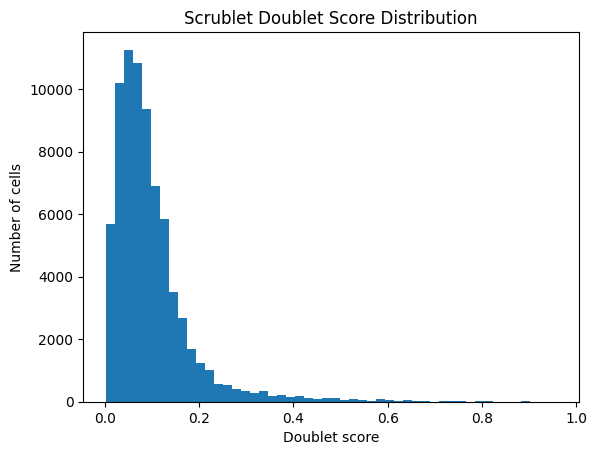

In [74]:
#📈 (Optional) Visualize Score Distribution
import matplotlib.pyplot as plt
plt.hist(doublet_scores, bins=50)
plt.xlabel("Doublet score")
plt.ylabel("Number of cells")
plt.title("Scrublet Doublet Score Distribution")
plt.show()


## 📘 Thesis Language Example

    Putative doublets were identified and removed using Scrublet, a computational method that detects transcriptomic profiles likely to arise from multiple cells captured together. Scrublet was applied to the raw UMI count matrix, and cells with high doublet scores were excluded from further analysis, ensuring greater purity in cell clustering and annotation.

## 📘 Thesis Language: Doublet Detection with Scrublet

    To identify potential doublets—instances where two nuclei are captured within the same droplet—Scrublet was applied to the raw count matrix prior to normalization. Scrublet simulates synthetic doublets based on observed transcriptomes and calculates a doublet score for each cell based on its similarity to simulated profiles. An automatic threshold was determined (doublet score = 0.67), above which cells were classified as predicted doublets. In this dataset, the estimated doublet rate was 1.6%, though only 0.2% of nuclei exceeded the classification threshold. While this rate is lower than the typical expected rate of ~10%, particularly in single-nucleus RNA-seq, it may reflect limitations in detectability due to lower transcript complexity per nucleus. For this reason, Scrublet was used in conjunction with a second method, Solo, to ensure robust doublet identification.



In [75]:
group_key = "sample_id"

In [76]:
adata_all.write("adata_all_pre_solo.h5ad", compression="gzip")


In [4]:
adata_all = sc.read('ec/adata_all_pre_solo.h5ad')

In [79]:
adata

AnnData object with n_obs × n_vars = 74453 × 2000
    obs: 'sample_id', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score_scrublet', 'predicted_doublet_scrublet', 'solo_doublet', 'solo_singlet', 'solo_predicted_doublet', 'is_singlet', '_scvi_batch', '_scvi_labels'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'is_singlet_colors', 'log1p', 'neighbors', 'pca', 'umap', 'hvg'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [83]:
if adata.raw is None:
    print('Raw is not existent')

## Scvi Solo

In [8]:
from anndata import AnnData
import scanpy as sc

def make_solo_anndata(adata: AnnData) -> AnnData:
    """
    Prepares an AnnData object for use with the Solo doublet detection model.

    Parameters:
        adata (AnnData): Raw count AnnData object.

    Returns:
        AnnData: Processed AnnData ready for Solo.
    """
    adata = adata.copy()

    # Minimal preprocessing expected by Solo
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, n_top_genes=2000, flavor="seurat_v3")
    adata = adata[:, adata.var.highly_variable].copy()

    return adata


In [49]:
import scvi
import pandas as pd
from anndata import AnnData

def run_solo_scvi_per_sample(adata: AnnData, group_key: str = "sample_id", max_epochs: int = 25, batch_size: int = 1024):
    """
    Runs SOLO doublet detection using SCVI per sample (group_key).
    Saves solo_doublet and solo_doublet_score in .obs.

    Parameters:
        adata (AnnData): full dataset with raw counts and group_key column in .obs
        group_key (str): key in .obs (e.g., "sample_id") to group by
        max_epochs (int): number of epochs for training
        batch_size (int): batch size during training

    Returns:
        AnnData: input AnnData with updated .obs annotations
    """
    all_dfs = []

    for sample in adata.obs[group_key].unique():
        print(f"🧪 Processing sample: {sample}")

        # Subset to current sample
        ad = adata[adata.obs[group_key] == sample].copy()

        # Setup SCVI
        scvi.model.SCVI.setup_anndata(ad)
        vae = scvi.model.SCVI(ad)
        vae.train(accelerator="gpu", devices=1, max_epochs=max_epochs, batch_size=batch_size)

        #NOTE: ΙΣΩΣ ΑΥΤΟ ΕΙΝΑΙ ΚΑΛΥΤΕΡΟ ?!
        #scvi.model.SCVI.setup_anndata(adata, layer = "counts",
                           #  categorical_covariate_keys=["Sample"],
                           #  continuous_covariate_keys=['pct_counts_mt', 'total_counts', 'pct_counts_ribo'])

        # Run SOLO
        solo_model = scvi.external.SOLO.from_scvi_model(vae)
        solo_model.train(accelerator="gpu", devices=1, max_epochs=max_epochs, batch_size=batch_size)

        # Predict
        preds = solo_model.predict()
        preds.index = ad.obs_names
        all_dfs.append(preds)

    # Combine all results
    all_preds = pd.concat(all_dfs)
    adata.obs["solo_doublet"] = all_preds["doublet"]
    adata.obs["solo_singlet"] = all_preds["singlet"]

    return adata


In [86]:
## So, the best practice for SCVI+SOLO is:
## Use the full gene set from .raw, not just 2,000 HVGs

# Restore full data from .raw
adata_all = adata_all.raw.to_adata()

# Now store raw counts in a usable layer
adata_all.layers["counts"] = adata_all.X.copy()

# Optional: keep current .X for visualization
# Or run HVG again on this new adata_all


#ignore error, it runs the first time!

AttributeError: 'NoneType' object has no attribute 'to_adata'

In [87]:
# 3. (Optional but good) Recalculate covariates if needed
import scanpy as sc
sc.pp.calculate_qc_metrics(adata_all, inplace=True)

In [90]:
adata_all.obs

,sample_id,region,brain_region,batch,donor_id,braak_stage,sex,age,n_genes,n_genes_by_counts,...,total_counts_mt,pct_counts_mt,doublet_score_scrublet,predicted_doublet_scrublet,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes
GSM4432645_AAACCTGAGGATGCGT-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,4620,4620,...,850.0,7.521458,0.148591,False,8.438366,9.332735,19.653128,25.546412,32.952836,46.243695
GSM4432645_AAACCTGAGTCAATAG-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,2562,2562,...,17.0,0.372971,0.153771,False,7.848934,8.424859,19.197016,25.756911,34.510750,49.846424
GSM4432645_AAACCTGCAAGTAGTA-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,484,484,...,42.0,6.624606,0.113582,False,6.184149,6.453625,29.179811,39.432177,55.205047,100.000000
GSM4432645_AAACCTGCAGACGTAG-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,244,244,...,21.0,6.885246,0.085354,False,5.501258,5.723585,36.393443,52.786885,85.573770,100.000000
GSM4432645_AAACCTGCATACTCTT-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,3069,3068,...,193.0,3.132100,0.092174,False,8.029107,8.726319,18.825057,25.803311,34.258358,50.032457
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM4432654_TTTGTCATCCACGTGG-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82,292,292,...,5.0,1.377410,0.058792,False,5.680173,5.897154,33.333333,47.107438,74.655647,100.000000
GSM4432654_TTTGTCATCGCGGATC-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82,498,498,...,3.0,0.429799,0.049327,False,6.212606,6.549651,33.524355,42.979943,57.306590,100.000000
GSM4432654_TTTGTCATCTATCGCC-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82,393,392,...,6.0,1.354402,0.321648,False,5.973810,6.095825,22.799097,34.085779,56.659142,100.000000
GSM4432654_TTTGTCATCTCGCTTG-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82,470,470,...,40.0,6.666667,0.142064,False,6.154858,6.398595,27.166667,38.333333,55.000000,100.000000


In [94]:
########
########
from anndata import AnnData

def run_solo_scvi_per_sample(adata: AnnData, group_key: str = "sample_id", max_epochs: int = 15, batch_size: int = 1024):
    """
    Improved SOLO per-sample doublet detection using SCVI.
    """

    all_dfs = []

    for sample in adata.obs[group_key].unique():
        print(f"🧪 Processing sample: {sample}")
        ad = adata[adata.obs[group_key] == sample].copy()

        # Setup SCVI with raw counts layer and covariates if available
        scvi.model.SCVI.setup_anndata(
            ad,
            layer="counts"
        )


        vae = scvi.model.SCVI(ad)
        vae.train(accelerator="gpu", devices=1, max_epochs=max_epochs, batch_size=batch_size)

        solo_model = scvi.external.SOLO.from_scvi_model(vae)
        solo_model.train(accelerator="gpu", devices=1, max_epochs=max_epochs, batch_size=batch_size)

        preds = solo_model.predict()
        preds.index = ad.obs_names
        all_dfs.append(preds)

    all_preds = pd.concat(all_dfs)
    adata.obs["solo_doublet"] = all_preds["doublet"]
    adata.obs["solo_singlet"] = all_preds["singlet"]

    return adata


In [15]:
!pip install scikit-misc

In [95]:
# RUN THE FUNCTION

adata_all = run_solo_scvi_per_sample(adata_all, group_key="sample_id", max_epochs=15,batch_size=1024)


🧪 Processing sample: GSM4432645


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:310: The number of training batches (6) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


🧪 Processing sample: GSM4432646


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:310: The number of training batches (9) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


🧪 Processing sample: GSM4432647


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:310: The number of training batches (3) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:310: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the 

Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


🧪 Processing sample: GSM4432648


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:310: The number of training batches (5) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
GPU available: True (cuda), used: True


🧪 Processing sample: GSM4432649


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:310: The number of training batches (5) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


🧪 Processing sample: GSM4432650


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:310: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


🧪 Processing sample: GSM4432651


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:310: The number of training batches (4) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


🧪 Processing sample: GSM4432652


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


🧪 Processing sample: GSM4432653


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


🧪 Processing sample: GSM4432654


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:310: The number of training batches (9) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\torch\utils\_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


In [96]:
adata_all.obs

,sample_id,region,brain_region,batch,donor_id,braak_stage,sex,age,n_genes,n_genes_by_counts,...,doublet_score_scrublet,predicted_doublet_scrublet,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,solo_doublet,solo_singlet
GSM4432645_AAACCTGAGGATGCGT-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,4620,4620,...,0.148591,False,8.438366,9.332735,19.653128,25.546412,32.952836,46.243695,0.848123,0.151877
GSM4432645_AAACCTGAGTCAATAG-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,2562,2562,...,0.153771,False,7.848934,8.424859,19.197016,25.756911,34.510750,49.846424,0.797172,0.202828
GSM4432645_AAACCTGCAAGTAGTA-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,484,484,...,0.113582,False,6.184149,6.453625,29.179811,39.432177,55.205047,100.000000,0.743966,0.256034
GSM4432645_AAACCTGCAGACGTAG-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,244,244,...,0.085354,False,5.501258,5.723585,36.393443,52.786885,85.573770,100.000000,0.371708,0.628293
GSM4432645_AAACCTGCATACTCTT-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,3069,3068,...,0.092174,False,8.029107,8.726319,18.825057,25.803311,34.258358,50.032457,0.819884,0.180116
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM4432654_TTTGTCATCCACGTGG-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82,292,292,...,0.058792,False,5.680173,5.897154,33.333333,47.107438,74.655647,100.000000,0.050903,0.949097
GSM4432654_TTTGTCATCGCGGATC-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82,498,498,...,0.049327,False,6.212606,6.549651,33.524355,42.979943,57.306590,100.000000,0.589022,0.410978
GSM4432654_TTTGTCATCTATCGCC-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82,393,392,...,0.321648,False,5.973810,6.095825,22.799097,34.085779,56.659142,100.000000,0.320739,0.679261
GSM4432654_TTTGTCATCTCGCTTG-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82,470,470,...,0.142064,False,6.154858,6.398595,27.166667,38.333333,55.000000,100.000000,0.700249,0.299751


In [98]:
adata.write("adata_all_with_doublets_labeled_scvi.h5ad", compression="gzip")

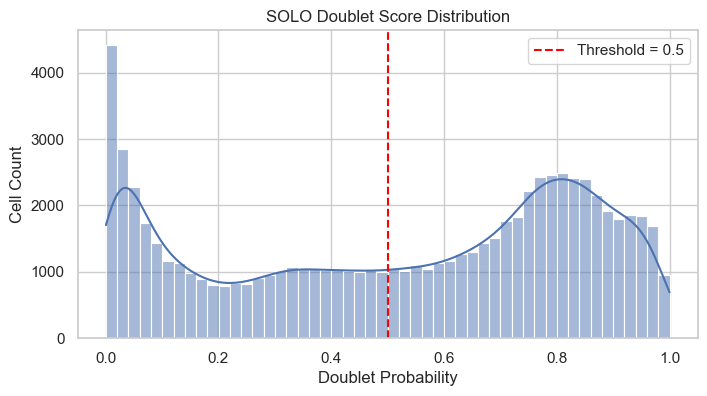

In [110]:
threshold = 0.5  # you can change this
plt.figure(figsize=(8, 4))
sns.histplot(adata_all.obs["solo_doublet"], bins=50, kde=True)
plt.axvline(threshold, color='red', linestyle='--', label=f"Threshold = {threshold}")
plt.title("SOLO Doublet Score Distribution")
plt.xlabel("Doublet Probability")
plt.ylabel("Cell Count")
plt.legend()
plt.show()


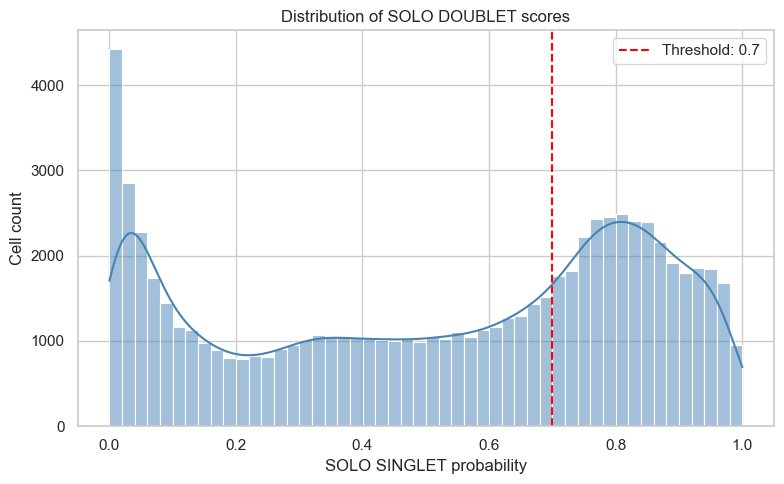

In [109]:

sns.set(style="whitegrid")

# Plot histogram
plt.figure(figsize=(8, 5))
sns.histplot(adata_all.obs["solo_doublet"], bins=50, kde=True, color="steelblue")
plt.axvline(0.7, color='red', linestyle='--', label='Threshold: 0.7')
plt.xlabel("SOLO SINGLET probability")
plt.ylabel("Cell count")
plt.title("Distribution of SOLO DOUBLET scores")
plt.legend()
plt.tight_layout()
plt.show()

In [111]:
adata_all.obs["solo_predicted_doublet"] = adata_all.obs["solo_doublet"] > 0.6

In [112]:
adata_all

AnnData object with n_obs × n_vars = 74453 × 26147
    obs: 'sample_id', 'region', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score_scrublet', 'predicted_doublet_scrublet', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'solo_doublet', 'solo_singlet', 'solo_predicted_doublet'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_mean_counts', 'log1p_total_counts'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    layers: 'counts'

In [114]:
# Πρεπει να κανω ξανα log transform ta data
# Normalize and log-transform safely
sc.pp.normalize_total(adata_all, target_sum=1e4)  # Total-count normalization
sc.pp.log1p(adata_all)  # log(x + 1) transformation (avoids log(0) = -inf)

In [115]:
sc.pp.pca(adata_all, n_comps=50)
sc.pp.neighbors(adata_all, n_pcs=50)
sc.tl.umap(adata_all)

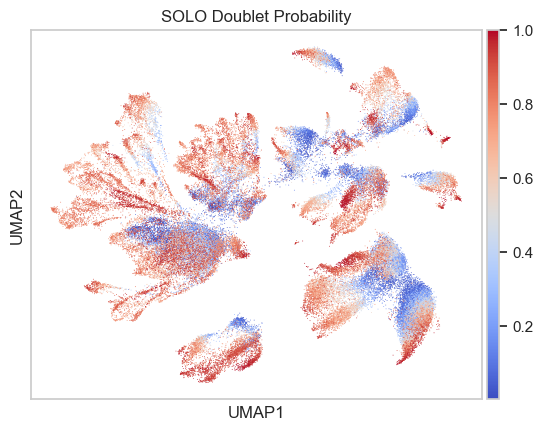

In [64]:
sc.pl.umap(adata_all, color="solo_doublet", cmap="coolwarm", title="SOLO Doublet Probability", vmax=1.0)


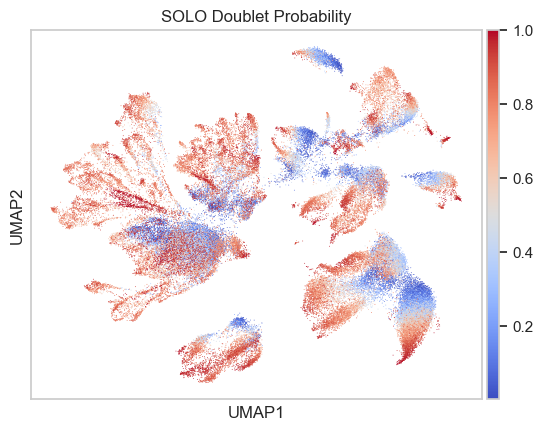

In [116]:
sc.pl.umap(adata_all, color="solo_doublet", cmap="coolwarm", title="SOLO Doublet Probability", vmax=1.0)


In [117]:
adata_all.obs

,sample_id,region,brain_region,batch,donor_id,braak_stage,sex,age,n_genes,n_genes_by_counts,...,predicted_doublet_scrublet,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,solo_doublet,solo_singlet,solo_predicted_doublet
GSM4432645_AAACCTGAGGATGCGT-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,4620,4620,...,False,8.438366,9.332735,19.653128,25.546412,32.952836,46.243695,0.848123,0.151877,True
GSM4432645_AAACCTGAGTCAATAG-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,2562,2562,...,False,7.848934,8.424859,19.197016,25.756911,34.510750,49.846424,0.797172,0.202828,True
GSM4432645_AAACCTGCAAGTAGTA-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,484,484,...,False,6.184149,6.453625,29.179811,39.432177,55.205047,100.000000,0.743966,0.256034,True
GSM4432645_AAACCTGCAGACGTAG-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,244,244,...,False,5.501258,5.723585,36.393443,52.786885,85.573770,100.000000,0.371708,0.628293,False
GSM4432645_AAACCTGCATACTCTT-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,3069,3068,...,False,8.029107,8.726319,18.825057,25.803311,34.258358,50.032457,0.819884,0.180116,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM4432654_TTTGTCATCCACGTGG-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82,292,292,...,False,5.680173,5.897154,33.333333,47.107438,74.655647,100.000000,0.050903,0.949097,False
GSM4432654_TTTGTCATCGCGGATC-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82,498,498,...,False,6.212606,6.549651,33.524355,42.979943,57.306590,100.000000,0.589022,0.410978,False
GSM4432654_TTTGTCATCTATCGCC-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82,393,392,...,False,5.973810,6.095825,22.799097,34.085779,56.659142,100.000000,0.320739,0.679261,False
GSM4432654_TTTGTCATCTCGCTTG-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82,470,470,...,False,6.154858,6.398595,27.166667,38.333333,55.000000,100.000000,0.700249,0.299751,True


## Doublet Detection Using Solo

To identify and exclude potential doublets from the single-cell RNA-seq data, we employed Solo, a deep learning-based doublet detection tool designed to operate on AnnData objects within the Python ecosystem. Solo trains a neural network on synthetic doublets generated from the input data to distinguish real cells from artificial doublets in a supervised manner.

First, the expected doublet rate for each dataset was estimated based on the empirical model provided by 10x Genomics:
expected rate=0.01+8×10−5×N
expected rate=0.01+8×10−5×N

where NN is the number of observed cells in the dataset (adata_all.n_obs). This formula accounts for both a baseline rate and the increasing probability of capturing doublets as more cells are loaded. The estimated rate was then used to compute the expected number of doublets:
expected doublets=expected rate×N
expected doublets=expected rate×N

Solo returns a probabilistic score for each cell, representing the likelihood of it being a doublet. These scores were sorted in descending order, and a threshold was determined by selecting the score corresponding to the expected number of doublets. Cells with scores above this threshold were labeled as doublets. This approach avoids reliance on arbitrary score cutoffs and instead leverages data-informed expectations.

In [123]:
# Step 1: Apply threshold
threshold = 0.5
adata_all.obs["is_doublet"] = adata_all.obs["solo_doublet"] >= threshold

# Step 2: Count doublets
n_doublets = adata_all.obs["is_doublet"].sum()
print(f"🧬 Number of predicted doublets: {n_doublets}")

# Step 3: Calculate percentage
percentage = 100 * n_doublets / adata_all.n_obs
print(f"📊 Percentage of predicted doublets for threshold=0.5: {percentage:.2f}%")


🧬 Number of predicted doublets: 42223
📊 Percentage of predicted doublets for threshold=0.5: 56.71%


In [124]:
# Step 1: Apply threshold
threshold = 0.7
adata_all.obs["is_doublet"] = adata_all.obs["solo_doublet"] >= threshold

# Step 2: Count doublets
n_doublets = adata_all.obs["is_doublet"].sum()
print(f"🧬 Number of predicted doublets: {n_doublets}")

# Step 3: Calculate percentage
percentage = 100 * n_doublets / adata_all.n_obs
print(f"📊 Percentage of predicted doublets for threshold=0.7: {percentage:.2f}%")


🧬 Number of predicted doublets: 30196
📊 Percentage of predicted doublets for threshold=0.5: 40.56%


In [125]:
# Step 1: Apply threshold
threshold = 0.9
adata_all.obs["is_doublet"] = adata_all.obs["solo_doublet"] >= threshold

# Step 2: Count doublets
n_doublets = adata_all.obs["is_doublet"].sum()
print(f"🧬 Number of predicted doublets: {n_doublets}")

# Step 3: Calculate percentage
percentage = 100 * n_doublets / adata_all.n_obs
print(f"📊 Percentage of predicted doublets for threshold=0.9: {percentage:.2f}%")


🧬 Number of predicted doublets: 8130
📊 Percentage of predicted doublets for threshold=0.9: 10.92%


In [127]:
# Step 1: Apply threshold
threshold = 0.8
adata_all.obs["is_doublet"] = adata_all.obs["solo_doublet"] >= threshold

# Step 2: Count doublets
n_doublets = adata_all.obs["is_doublet"].sum()
print(f"🧬 Number of predicted doublets: {n_doublets}")

# Step 3: Calculate percentage
percentage = 100 * n_doublets / adata_all.n_obs
print(f"📊 Percentage of predicted doublets for threshold=0.8: {percentage:.2f}%")


🧬 Number of predicted doublets: 19510
📊 Percentage of predicted doublets for threshold=0.8: 26.20%


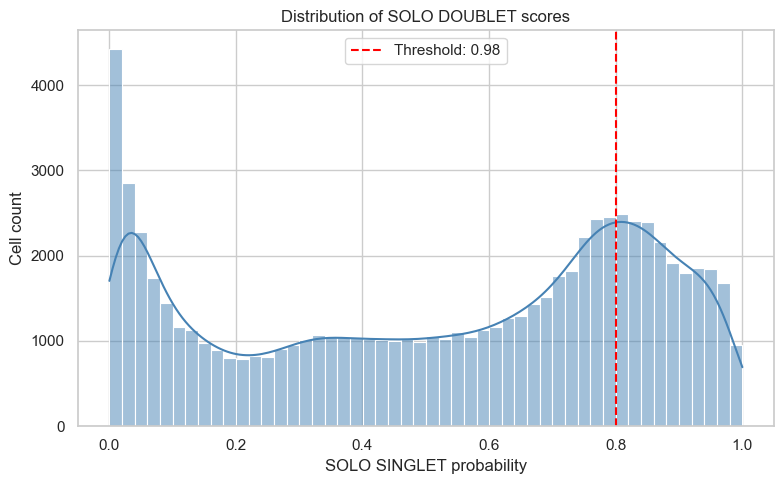

In [128]:

sns.set(style="whitegrid")

# Plot histogram
plt.figure(figsize=(8, 5))
sns.histplot(adata_all.obs["solo_doublet"], bins=50, kde=True, color="steelblue")
plt.axvline(0.8, color='red', linestyle='--', label='Threshold: 0.8')
plt.xlabel("SOLO SINGLET probability")
plt.ylabel("Cell count")
plt.title("Distribution of SOLO DOUBLET scores")
plt.legend()
plt.tight_layout()
plt.show()

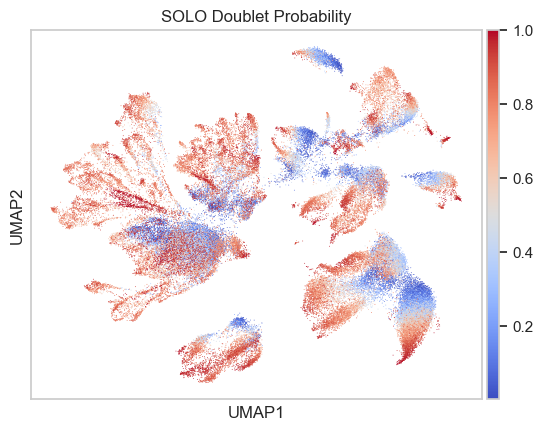

In [129]:
sc.pl.umap(adata_all, color="solo_doublet", cmap="coolwarm", title="SOLO Doublet Probability", vmax=1.0)


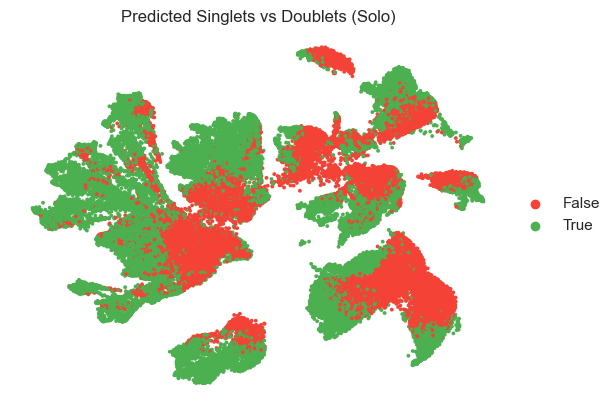

In [131]:
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc

# If UMAP is not yet computed:
if "X_umap" not in adata_all.obsm:
    sc.pp.neighbors(adata_all)
    sc.tl.umap(adata_all)

# Set color palette
palette = {"True": "#4CAF50", "False": "#F44336"}  # green for singlets, red for doublets

# Plot
sc.pl.umap(
    adata_all,
    color="solo_predicted_doublet",
    palette=palette,
    size=30,
    title="Predicted Singlets vs Doublets (Solo)",
    frameon=False,
    legend_loc='right margin',
    show=True
)


In [138]:
# final threshhold is 0.9 (10% doublets)
adata_all.obs["solo_predicted_doublet"] = adata_all.obs["solo_doublet"] > 0.9

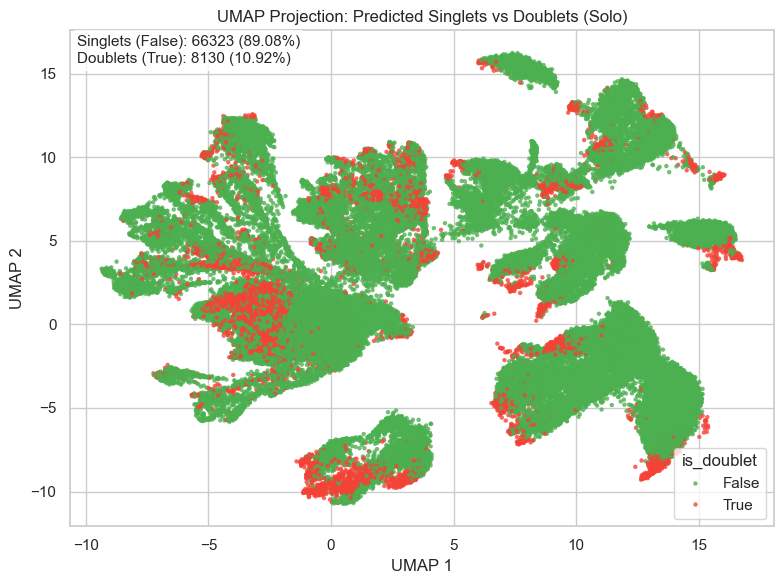

In [144]:
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import pandas as pd

# Ensure UMAP is available
if "X_umap" not in adata_all.obsm:
    sc.pp.neighbors(adata_all)
    sc.tl.umap(adata_all)

# Extract UMAP coordinates
umap_df = pd.DataFrame(adata_all.obsm["X_umap"], columns=["UMAP1", "UMAP2"])
umap_df["solo_predicted_doublet"] = adata_all.obs["solo_predicted_doublet"].values

# Compute counts and percentages
counts = umap_df["solo_predicted_doublet"].value_counts()
percentages = (counts / counts.sum() * 100).round(2)

# Color palette
palette = {True:"#F44336" , False: "#4CAF50"}

# Plot
plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=umap_df,
    x="UMAP1",
    y="UMAP2",
    hue="solo_predicted_doublet",
    palette=palette,
    s=10,
    alpha=0.8,
    linewidth=0
)

# Add annotation box
textstr = '\n'.join((
    f"Singlets (False): {counts[False]} ({percentages[False]}%)",
    f"Doublets (True): {counts[True]} ({percentages[True]}%)"
))

# Styling
props = dict(boxstyle='round', facecolor='white', alpha=0.8)
plt.text(0.01, 0.99, textstr, transform=plt.gca().transAxes,
         fontsize=11, verticalalignment='top', bbox=props)

plt.title("UMAP Projection: Predicted Singlets vs Doublets (Solo)")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.legend(title="is_doublet", loc="lower right")
plt.tight_layout()
plt.show()


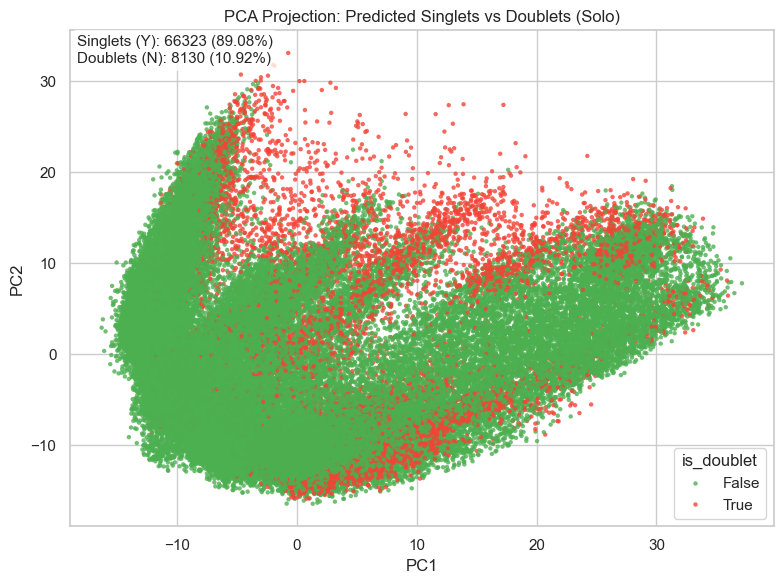

In [143]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import scanpy as sc

# Ensure PCA is computed
if "X_pca" not in adata_all.obsm:
    sc.pp.pca(adata_all)

# Extract PCA coordinates
pca_df = pd.DataFrame(adata_all.obsm["X_pca"][:, :2], columns=["PC1", "PC2"])
pca_df["solo_predicted_doublet"] = adata_all.obs["solo_predicted_doublet"].values

# Counts and percentages
counts = pca_df["solo_predicted_doublet"].value_counts()
percentages = (counts / counts.sum() * 100).round(2)

# Color palette
palette = {False: "#4CAF50", True: "#F44336"}

# Plot
plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=pca_df,
    x="PC1",
    y="PC2",
    hue="solo_predicted_doublet",
    palette=palette,
    s=10,
    alpha=0.8,
    linewidth=0
)

# Annotation box
textstr = '\n'.join((
    f"Singlets (Y): {counts[False]} ({percentages[False]}%)",
    f"Doublets (N): {counts[True]} ({percentages[True]}%)"
))
props = dict(boxstyle='round', facecolor='white', alpha=0.8)
plt.text(0.01, 0.99, textstr, transform=plt.gca().transAxes,
         fontsize=11, verticalalignment='top', bbox=props)

plt.title("PCA Projection: Predicted Singlets vs Doublets (Solo)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title="is_doublet", loc="lower right")
plt.tight_layout()
plt.show()


## 📝 Suggested Thesis Caption

    Figure X: PCA projection of single-cell transcriptomes colored by predicted singlet status. PC1 and PC2 represent the directions of maximum variance in gene expression across cells. High-confidence singlets (green) and predicted doublets (red) are clearly separated, supporting the reliability of the Solo classifier.
---

In [145]:
import pandas as pd

# Get the loadings matrix from Scanpy (genes x PCs)
loadings_df = pd.DataFrame(
    adata_all.varm["PCs"][:, :2],  # PCs 1 and 2
    index=adata_all.var_names,
    columns=["PC1", "PC2"]
)

# Get top 10 genes by absolute loading for PC1 and PC2
top_genes_pc1 = loadings_df["PC1"].abs().sort_values(ascending=False).head(10)
top_genes_pc2 = loadings_df["PC2"].abs().sort_values(ascending=False).head(10)

# Combine into one DataFrame for display
top_genes_df = pd.concat([top_genes_pc1, top_genes_pc2], axis=1)
top_genes_df.columns = ["|PC1 Loading|", "|PC2 Loading|"]

# Display result
print(top_genes_df)


           |PC1 Loading|  |PC2 Loading|
MEG3            0.101915            NaN
RBFOX1          0.099733            NaN
KCNIP4          0.096130            NaN
CSMD1           0.093545            NaN
DLGAP1          0.092849            NaN
SYT1            0.090513            NaN
FAM155A         0.088077            NaN
NRG3            0.086189            NaN
OPCML           0.085663            NaN
NRXN1           0.079075            NaN
LINC00486            NaN       0.125928
RASGEF1B             NaN       0.112656
QKI                  NaN       0.100331
MT-CO3               NaN       0.098237
IL1RAPL1             NaN       0.098129
CTNNA3               NaN       0.095413
PLP1                 NaN       0.092153
SLC44A1              NaN       0.090420
PDE4B                NaN       0.087145
PPP2R2B              NaN       0.083258


## 📌 Interpretation for Thesis

    These genes contribute the most to the observed variation in your dataset.

    You can inspect whether these are cell-type markers, mitochondrial genes, or technical artifacts.

    You may also correlate them to known cell-type specific markers to support downstream annotation.

### Aiming to take the top PCA-loading genes and interpret whether they are:

    Biologically meaningful (e.g., cell-type markers)

    Technical artifacts (e.g., mitochondrial or ribosomal genes)

    Batch-related or noise

#### : Inspect Each Gene's Expression Pattern

Use sc.pl.violin() or sc.pl.dotplot() to see if these genes:

    Are highly expressed in specific clusters

    Show signs of batch effect

    Are mostly mitochondrial

In [98]:
# Plot expression of top PC1 genes across clusters (if available)
# γΙΑ ΝΑ ΤΡΕΞΕΙ ΑΥΤΟ ΠΡΕΠΕΙ ΠΡΩΤΑ ΝΑ ΚΑΝΩ CLUSTERING
# TO GET BACK TO
sc.pl.violin(adata_all, keys=top_genes_pc1.index.tolist(), groupby='leiden', rotation=90)


KeyError: "Could not find keys '['leiden']' in columns of `adata.obs` or in adata.raw.var_names."

---
#### Check for Mitochondrial or Ribosomal Genes  & filtering (might be done already, making sure)
This helps flag technical artifacts

In [149]:
adata_all

AnnData object with n_obs × n_vars = 74453 × 26147
    obs: 'sample_id', 'region', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score_scrublet', 'predicted_doublet_scrublet', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'solo_doublet', 'solo_singlet', 'solo_predicted_doublet', 'is_doublet'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_mean_counts', 'log1p_total_counts'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'solo_predicted_doublet_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

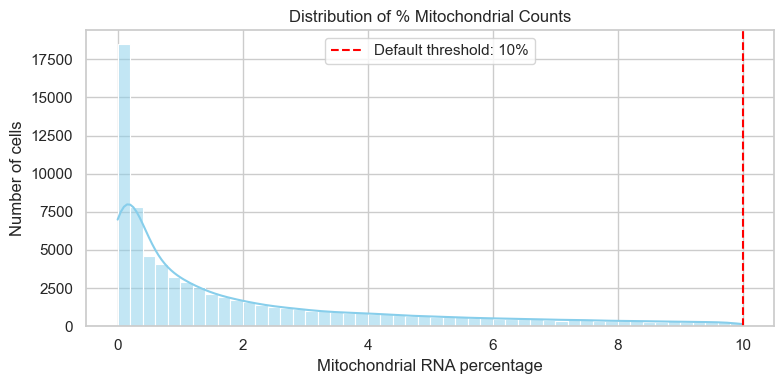

In [151]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))
sns.histplot(adata.obs["pct_counts_mt"], bins=50, kde=True, color="skyblue")
plt.axvline(10, color="red", linestyle="--", label="Default threshold: 10%")
plt.xlabel("Mitochondrial RNA percentage")
plt.ylabel("Number of cells")
plt.title("Distribution of % Mitochondrial Counts")
plt.legend()
plt.tight_layout()
plt.show()


In [152]:
# Filter low-expressed genes
sc.pp.filter_genes(adata_all, min_cells=3)

# Filter low-quality cells
sc.pp.filter_cells(adata_all, min_genes=200)
sc.pp.filter_cells(adata_all, min_counts=500)

# Annotate mitochondrial genes and filter
adata_all.var["mt"] = adata_all.var_names.str.upper().str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata_all, qc_vars=["mt"], inplace=True)
adata_all = adata_all[adata_all.obs["pct_counts_mt"] < 10].copy()


In [153]:
adata_all.layers["counts_after_filtering"] = adata_all.X.copy()

In [154]:
first_raw_saved_ever = adata_all.raw.copy()


In [158]:
first_raw_saved_ever

In [157]:
first_raw_saved_ever.write("adata_raw.h5ad", compression="gzip")

AttributeError: 'NoneType' object has no attribute 'write'

In [155]:
adata_all.raw = adata_all

In [161]:
adata_all.layers['counts']

<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 56615359 stored elements and shape (74453, 26147)>

In [162]:
adata_all.layers['counts_after_filtering']

<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 56615359 stored elements and shape (74453, 26147)>

---
## 🧬 Thesis-Ready Explanation:

    To obtain a denoised and biologically informative low-dimensional embedding of the data, we extracted the latent representation learned by the scVI model. scVI (single-cell Variational Inference) is a deep generative model based on a variational autoencoder (VAE) architecture that captures the underlying biological variation while accounting for technical noise such as library size, batch effects, and dropout events.

    The following command was used to compute and store the latent representation:

adata.obsm['X_scVI'] = model.get_latent_representation()

This representation, typically a vector of 10–30 dimensions per cell, was stored in the obsm['X_scVI'] slot of the AnnData object. It was subsequently used as input for dimensionality reduction (e.g., UMAP), clustering, and differential expression analysis, leveraging its improved separation of biologically meaningful cell states.

In [163]:
from scvi.model import SCVI
import scanpy as sc

def train_scvi_with_batch(adata, batch_key="sample_id", latent_dim=30):

    # Setup AnnData with batch key
    SCVI.setup_anndata(adata,layer="counts", batch_key=batch_key)

    # Initialize SCVI model
    scvi_model = SCVI(adata, n_latent=latent_dim)

    # Train model
    scvi_model.train()

    # Save latent representation
    adata.obsm["X_scVI"] = scvi_model.get_latent_representation()

    return scvi_model, adata


In [164]:

scvi_model, adata_all = train_scvi_with_batch(adata_all, batch_key="sample_id")


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\D_F\miniconda3\envs\sc_solo_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.


Training:   0%|          | 0/107 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=107` reached.


In [165]:
adata_all.obsm["X_scVI"]

array([[-0.46154168,  1.3843762 , -1.0423208 , ..., -0.8804747 ,
        -0.9205222 ,  0.07784379],
       [-1.0365105 , -0.7383313 , -0.41624722, ..., -0.7508515 ,
         0.12423807, -1.0753915 ],
       [ 0.47980148,  0.43321913, -0.36254874, ...,  0.23675263,
        -1.3965086 ,  0.09146023],
       ...,
       [-1.031851  , -0.78120303,  0.09549499, ...,  0.0408349 ,
         0.8116975 ,  0.01148927],
       [ 1.5231022 ,  0.07149529, -0.08859703, ...,  0.4405924 ,
         0.54163504,  1.4899349 ],
       [ 1.2690196 ,  1.9254631 , -0.3723826 , ...,  0.84863126,
         1.6351548 , -0.3846534 ]], dtype=float32)

In [166]:
adata_all.obsm["X_scVI"]

array([[-0.46154168,  1.3843762 , -1.0423208 , ..., -0.8804747 ,
        -0.9205222 ,  0.07784379],
       [-1.0365105 , -0.7383313 , -0.41624722, ..., -0.7508515 ,
         0.12423807, -1.0753915 ],
       [ 0.47980148,  0.43321913, -0.36254874, ...,  0.23675263,
        -1.3965086 ,  0.09146023],
       ...,
       [-1.031851  , -0.78120303,  0.09549499, ...,  0.0408349 ,
         0.8116975 ,  0.01148927],
       [ 1.5231022 ,  0.07149529, -0.08859703, ...,  0.4405924 ,
         0.54163504,  1.4899349 ],
       [ 1.2690196 ,  1.9254631 , -0.3723826 , ...,  0.84863126,
         1.6351548 , -0.3846534 ]], dtype=float32)

# WRITE - READ

In [167]:
# Save to a folder (will create it if not exists)
scvi_model.save("scvi_model/", overwrite=True)
adata_all.write("adata_all_after_scvi.h5ad")


In [2]:
adata_all = sc.read("adata_all_after_scvi.h5ad")
scvi_model = SCVI.load("scvi_model/", adata=adata_all)

---


## CLustering

In [168]:
adata_all

AnnData object with n_obs × n_vars = 74453 × 26147
    obs: 'sample_id', 'region', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score_scrublet', 'predicted_doublet_scrublet', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'solo_doublet', 'solo_singlet', 'solo_predicted_doublet', 'is_doublet', 'n_counts', 'log1p_total_counts_mt', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_mean_counts', 'log1p_total_counts'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'solo_predicted_doublet_colors', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_pca', 'X_umap', 'X_scVI'
    varm: 'PCs'
    layers: 'counts', 'counts_after_filtering'
    obsp: 'distances'

In [169]:
adata_all.uns

OrderedDict([('log1p', {'base': None}),
             ('hvg', {'flavor': 'seurat'}),
             ('pca',
              {'params': {'zero_center': True,
                'use_highly_variable': False,
                'mask_var': None},
               'variance': array([134.22298931,  79.40456939,  40.86098426,  29.2837365 ,
                       26.86919928,  15.95462345,  12.35368257,  10.02195962,
                        7.57159311,   7.18111753,   6.04107009,   5.19286923,
                        4.78334741,   4.16103286,   3.84726569,   3.61031478,
                        3.42378164,   3.33228183,   3.06647698,   3.04845949,
                        2.99116335,   2.69103709,   2.64716298,   2.60011988,
                        2.51327449,   2.4182655 ,   2.3019798 ,   2.20339552,
                        2.1718154 ,   2.15050133,   2.13967367,   2.0839616 ,
                        2.05794127,   2.00179457,   2.00055405,   1.99191446,
                        1.95819748,   1.93757891,   1

In [13]:
import numpy as np

# For dense matrix
if not isinstance(adata_all.X, np.ndarray):
    X_data = adata_all.X.toarray()  # Convert sparse to dense if needed
else:
    X_data = adata_all.X

print("Min value:", np.min(X_data))
print("Max value:", np.max(X_data))
print("Median value:", np.median(X_data))

Min value: 0.0
Max value: 4530.0
Median value: 0.0


In [22]:
adata_all.obsm

AxisArrays with keys: X_pca, X_scVI, X_umap

In [21]:
import numpy as np

# For dense matrix

X_data = adata_all.obsm['X_scVI']

print("Min value:", np.min(X_data))
print("Max value:", np.max(X_data))
print("Median value:", np.median(X_data))

Min value: -7.678995
Max value: 8.060142
Median value: -0.01195398


In [23]:
import numpy as np

# For dense matrix

X_data = adata_all.obsm['X_pca']

print("Min value:", np.min(X_data))
print("Max value:", np.max(X_data))
print("Median value:", np.median(X_data))

Min value: -16.420952
Max value: 37.139946
Median value: -0.05987163


In [24]:
adata_all.raw

In [25]:
print("Min:", np.min(adata_all.X))
print("Max:", np.max(adata_all.X))

Min: 0.0
Max: 4530.0


Adata_all is not log transformed

In [26]:
print("Min:", np.min(adata_all.raw))
print("Max:", np.max(adata_all.raw))

Min: Raw AnnData with n_obs × n_vars = 74453 × 26147
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
Max: Raw AnnData with n_obs × n_vars = 74453 × 26147
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'


In [27]:
from scipy.sparse import issparse

if adata_all.raw is not None:
    if issparse(adata_all.raw.X):
        print(f"Raw data min: {adata_all.raw.X.min()}, max: {adata_all.raw.X.max()}")
    else:
        print(f"Raw data min: {np.min(adata_all.raw.X)}, max: {np.max(adata_all.raw.X)}")
else:
    print("No raw data stored.")

Raw data min: 0.0, max: 4530.0


Adata_all.raw is not log transformed either // λογικα ειναι τα ιδια ακριβως

In [28]:
sc.pp.normalize_total(adata_all, target_sum=1e4)  # CPM-like normalization
sc.pp.log1p(adata_all)  # Apply log(1 + x)

εδω ομως λεει οτι μαλλον ειναι.

In [29]:
print("Min:", np.min(adata_all.X))
print("Max:", np.max(adata_all.X))

Min: 0.0
Max: 8.282468


άλλαξε παντως. συνεχιζω.

In [170]:
sc.pp.highly_variable_genes(adata_all, n_top_genes = 2000)

In [173]:
adata_all.var

,gene_ids,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,log1p_mean_counts,log1p_total_counts,highly_variable,means,dispersions,dispersions_norm
RP11-34P13.7,ENSG00000238009,325,False,325,0.007621,99.563483,567.383972,0.007592,6.342797,False,0.032358,2.816959,-0.360673
FO538757.2,ENSG00000279457,7612,False,7612,0.211716,89.776100,15762.907227,0.192038,9.665479,False,0.744009,3.057096,0.038356
AP006222.2,ENSG00000228463,1699,False,1699,0.039113,97.718023,2912.044189,0.038367,7.976954,False,0.157478,2.896495,-0.011655
RP4-669L17.10,ENSG00000237094,686,False,686,0.015248,99.078613,1135.272949,0.015133,7.035509,False,0.061708,2.822794,-0.335068
RP5-857K21.4,ENSG00000230021,11994,False,11994,0.331009,83.890508,24644.640625,0.285937,10.112355,False,0.940263,2.849761,-1.997379
...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC007325.2,ENSG00000277196,525,False,525,0.014692,99.294857,1093.880981,0.014585,6.998401,False,0.062528,2.759718,-0.611854
BX072566.1,ENSG00000277630,14,False,14,0.000232,99.981196,17.287628,0.000232,2.906225,False,0.000528,1.344675,-6.821262
AL354822.1,ENSG00000278384,343,False,343,0.008253,99.539307,614.441833,0.008219,6.422340,False,0.033693,2.739521,-0.700482
AC004556.1,ENSG00000276345,17,False,17,0.000480,99.977167,35.741531,0.000480,3.603908,True,0.002752,3.159364,1.141851


#### Filter the data to only include HVGs

In [174]:
adata = adata_all[:, adata_all.var.highly_variable]

In [175]:
adata

View of AnnData object with n_obs × n_vars = 74453 × 2000
    obs: 'sample_id', 'region', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score_scrublet', 'predicted_doublet_scrublet', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'solo_doublet', 'solo_singlet', 'solo_predicted_doublet', 'is_doublet', 'n_counts', 'log1p_total_counts_mt', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'solo_predicted_doublet_colors', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_pca', 'X_umap', 'X_scVI'
    varm: 'PCs

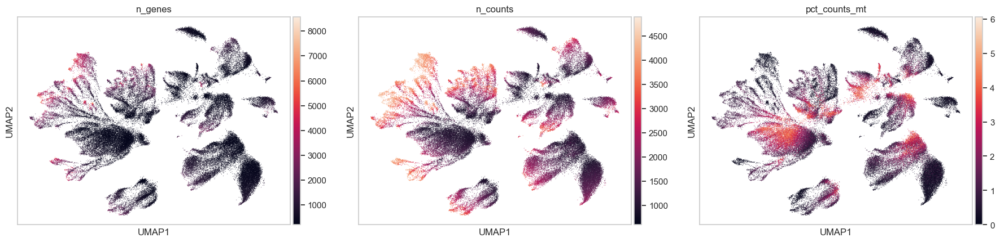

In [176]:
sc.pl.umap(adata, color=["n_genes", "n_counts", "pct_counts_mt"])


In [58]:
# για να σταματησει το error: ValueError: Value passed for key 'X_scVI' is of incorrect shape. Values of obsm must match dimensions ('obs',) of parent. Value had shape (74453,) while it should have had (63286,).
# Στην ουσια πριν υπολόγισα latent space με τα doublets μεσα. και τωρα που τα αφαιρεσα υπάρχει πρόβλημα.
# Get the cell indices that remain after filtering
filtered_cell_indices = adata.obs_names

# Get the latent representations only for these cells
latent_reps = scvi_model.get_latent_representation()[scvi_model.adata.obs_names.isin(filtered_cell_indices)]

# Verify the shapes match
print(f"Latent reps shape: {latent_reps.shape}")  # Should be (63286, latent_dim)
print(f"adata shape: {adata.shape}")  # Should be (63286, ...)

# Add to your filtered adata
adata.obsm["X_scVI"] = latent_reps

# Now you can proceed with neighbors and UMAP
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata)
#
#

Latent reps shape: (63286, 30)
adata shape: (63286, 2000)


In [114]:
print(f"scVI model cells: {len(scvi_model.adata.obs)}")
print(f"Filtered adata cells: {len(adata.obs)}")
print(f"Are indices aligned: {all(adata.obs.index == scvi_model.adata.obs.index[:len(adata)])}")

scVI model cells: 74453
Filtered adata cells: 63286
Are indices aligned: False


In [69]:
# Get indices of filtered cells in original data
cell_mask = scvi_model.adata.obs_names.isin(adata.obs_names)

# Get latent reps only for filtered cells
latent_reps = scvi_model.get_latent_representation()[cell_mask]

# Verify shape
print(f"Latent reps shape: {latent_reps.shape}")  # Must be (63286, 30)


# Convert to numpy array if needed
latent_reps_array = np.array(latent_reps)

# Ensure no dimension mismatch
assert latent_reps_array.shape[0] == adata.n_obs

# Assign to obsm
adata.obsm["X_scVI"] = latent_reps_array



Latent reps shape: (63286, 30)


In [177]:

sc.pp.neighbors(adata, use_rep="X_scVI")  # graph from latent space
sc.tl.umap(adata)
sc.tl.leiden(adata)


C:\Users\D_F\AppData\Local\Temp\ipykernel_5400\576304894.py:3: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)


In [131]:
# Check if X_scVI exists
print("X_scVI available:", "X_scVI" in adata.obsm)

# View the first 5 cells and all dimensions
print(adata.obsm["X_scVI"][:5, :])  # Rows=cells, columns=latent dimensions

X_scVI available: True
[[-1.4018661   0.47007096  0.11704683 -1.0041711  -0.14323477 -0.25252053
   0.5403412   1.3318657  -0.26999855  1.0112811  -0.74429107  0.00282538
   1.2293254   0.20863616 -0.07021904  0.8923429  -0.4643924  -0.9206853
  -0.70472693 -0.23702465 -0.0369513   0.87489897  0.49998754  0.98548377
   0.22155394 -1.0432659   0.7658074   0.30860057 -0.13540375  0.24977335]
 [ 0.33362198  0.30094048  0.89112365 -0.37953615  0.44195843 -1.7722294
   0.08595502 -0.13389292 -1.3980148   0.775405   -0.71669304 -0.21411514
  -1.2763784  -0.9994545   0.35057724  1.1897764   1.1256322  -1.0878716
   0.44692004  0.62328506 -0.6628072  -0.8737315   1.9909074  -1.19239
   1.2820449  -0.30010414  0.3925991   0.6896429  -0.09923869  0.2968745 ]
 [-0.7768174  -0.13726991 -1.9846797  -1.800745    0.23392306 -0.32951823
   0.6628143  -1.0707713   0.4826183   0.11561894 -1.0230196  -1.7885308
  -0.2016055  -1.0564635  -0.780987    1.5961847   0.59314966  0.69218874
  -0.16545236 -1.353

In [132]:
# Get shape (n_cells × latent_dim)
print(f"scVI latent space shape: {adata.obsm['X_scVI'].shape}")

# Convert to DataFrame for better visualization (optional)
import pandas as pd
scvi_df = pd.DataFrame(adata.obsm["X_scVI"], 
                      index=adata.obs_names,
                      columns=[f"scVI_{i}" for i in range(adata.obsm["X_scVI"].shape[1])])
print(scvi_df.head())

scVI latent space shape: (63286, 30)
                                            scVI_0    scVI_1    scVI_2  \
GSM4432645_AAACCTGAGGATGCGT-1_GSM4432645 -1.401866  0.470071  0.117047   
GSM4432645_AAACCTGAGTCAATAG-1_GSM4432645  0.333622  0.300940  0.891124   
GSM4432645_AAACCTGCAAGTAGTA-1_GSM4432645 -0.776817 -0.137270 -1.984680   
GSM4432645_AAACCTGCAGACGTAG-1_GSM4432645  1.401985 -0.847083  1.589235   
GSM4432645_AAACCTGCATACTCTT-1_GSM4432645 -1.492480  0.357503 -0.719236   

                                            scVI_3    scVI_4    scVI_5  \
GSM4432645_AAACCTGAGGATGCGT-1_GSM4432645 -1.004171 -0.143235 -0.252521   
GSM4432645_AAACCTGAGTCAATAG-1_GSM4432645 -0.379536  0.441958 -1.772229   
GSM4432645_AAACCTGCAAGTAGTA-1_GSM4432645 -1.800745  0.233923 -0.329518   
GSM4432645_AAACCTGCAGACGTAG-1_GSM4432645 -0.703927  0.253830 -2.157630   
GSM4432645_AAACCTGCATACTCTT-1_GSM4432645 -1.052776 -0.138131 -0.216926   

                                            scVI_6    scVI_7    scVI_8  \

In [178]:
adata

AnnData object with n_obs × n_vars = 74453 × 2000
    obs: 'sample_id', 'region', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score_scrublet', 'predicted_doublet_scrublet', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'solo_doublet', 'solo_singlet', 'solo_predicted_doublet', 'is_doublet', 'n_counts', 'log1p_total_counts_mt', '_scvi_batch', '_scvi_labels', 'leiden'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'solo_predicted_doublet_colors', '_scvi_uuid', '_scvi_manager_uuid', 'leiden'
    obsm: 'X_pca', 'X_umap', 'X_scVI'
  

In [135]:
import numpy as np

# Check for log1p transformation
if 'log1p' in adata.uns:
    print(f"Data is log1p transformed (base: {adata.uns['log1p'].get('base', 'e')})")
else:
    # Inspect values empirically
    sample_data = adata.X[:100].toarray() if hasattr(adata.X, 'toarray') else adata.X[:100]
    print("Value statistics:")
    print(f"Min: {np.min(sample_data):.2f}, Max: {np.max(sample_data):.2f}, Median: {np.median(sample_data):.2f}")
    
    # Heuristic check
    if np.min(sample_data) < 0:
        print("Warning: Negative values detected - may be centered/scaled data")
    elif np.max(sample_data) > 30:  # Arbitrary threshold for counts
        print("Data appears to be raw counts (not log-transformed)")
    elif 0 <= np.max(sample_data) <= 10:
        print("Data is likely log1p-transformed (typical range 0-10)")

Data is log1p transformed (base: None)


In [136]:
# Check for raw attribute
if adata.raw is not None:
    print("\nRaw data available:")
    print(f"Shape: {adata.raw.shape}")
    print(f"Features: {adata.raw.var_names[:5].tolist()}...")
    
    # Compare with processed data
    print("\nProcessed vs. raw dimensions:")
    print(f"Processed: {adata.shape}, Raw: {adata.raw.shape}")
    
    # Check if raw contains counts
    raw_sample = adata.raw.X[:100].toarray() if hasattr(adata.raw.X, 'toarray') else adata.raw.X[:100]
    print("\nRaw value statistics:")
    print(f"Min: {np.min(raw_sample):.2f}, Max: {np.max(raw_sample):.2f}")
else:
    print("\nNo raw data attached. Use `adata.raw = adata` to preserve raw counts before processing.")


Raw data available:
Shape: (63286, 26147)
Features: ['RP11-34P13.7', 'FO538757.2', 'AP006222.2', 'RP4-669L17.10', 'RP5-857K21.4']...

Processed vs. raw dimensions:
Processed: (63286, 2000), Raw: (63286, 26147)

Raw value statistics:
Min: 0.00, Max: 333.00


---
    A[Raw Counts] --> B[QC Filtering]
    B --> C[Normalize_total]
    C --> D[Log1p]
    D --> E[HVG Selection]
    E --> F[Dimensionality Reduction]
    F --> G[Clustering]
---

In [138]:
adata

AnnData object with n_obs × n_vars = 63286 × 2000
    obs: 'sample_id', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age', 'n_genes', 'n_genes_by_counts', 'n_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score_scrublet', 'predicted_doublet_scrublet', 'solo_doublet', 'solo_singlet', 'solo_predicted_doublet', 'is_singlet', '_scvi_batch', '_scvi_labels', 'total_counts_mito', 'pct_counts_mito', 'leiden', 'leiden_0.2', 'leiden_0.5', 'leiden_0.8', 'leiden_1.0', 'leiden_0.4', 'leiden_0.6', 0.4
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mito', 'mean', 'std'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'is_singlet_colors', 'log1p', 'neighbors', 'pca', 'umap', 'hvg', 'leiden', 'leiden_colors', 'leiden_0.2', 'leiden_0.5', 'leiden_0.8', 'leiden_1.0', 'leiden_0.2_colors', 'leiden_0.5_colors', 'leiden_0.8_colors', 'leiden_1.0_colors', 'leiden_0.4', 'leide

In [181]:
adata.obs

,sample_id,region,brain_region,batch,donor_id,braak_stage,sex,age,n_genes,n_genes_by_counts,...,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,solo_doublet,solo_singlet,solo_predicted_doublet,n_counts,log1p_total_counts_mt,_scvi_batch,_scvi_labels,leiden
GSM4432645_AAACCTGAGGATGCGT-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,4620,4620,...,11.856819,23.539854,0.848123,0.151877,False,4315.981445,3.779290,0,0,9
GSM4432645_AAACCTGAGTCAATAG-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,2562,2562,...,14.809441,29.862294,0.797172,0.202828,False,3581.051514,2.696103,0,0,9
GSM4432645_AAACCTGCAAGTAGTA-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,484,484,...,43.825984,100.000488,0.743966,0.256034,False,1425.587280,3.557311,0,0,6
GSM4432645_AAACCTGCAGACGTAG-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,244,244,...,82.555254,99.999876,0.371708,0.628293,False,887.855469,3.656960,0,0,8
GSM4432645_AAACCTGCATACTCTT-1_GSM4432645,GSM4432645,Entorhinal cortex,Entorhinal cortex,C,2,0,Male,60,3068,3068,...,14.039410,28.442897,0.819884,0.180116,False,3804.457520,3.550292,0,0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM4432654_TTTGTCATCCACGTGG-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82,292,292,...,69.359580,99.999575,0.050903,0.949097,False,1006.349304,2.713492,9,0,4
GSM4432654_TTTGTCATCGCGGATC-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82,498,498,...,42.922037,99.999752,0.589022,0.410978,False,1425.104858,2.217983,9,0,16
GSM4432654_TTTGTCATCTATCGCC-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82,392,392,...,52.026566,99.999990,0.320739,0.679261,False,1264.747314,2.706975,9,0,3
GSM4432654_TTTGTCATCTCGCTTG-1_GSM4432654,GSM4432654,Entorhinal cortex,Entorhinal cortex,D,10,6,Male,82,470,470,...,45.035936,99.999637,0.700249,0.299751,False,1410.661011,3.713701,9,0,13


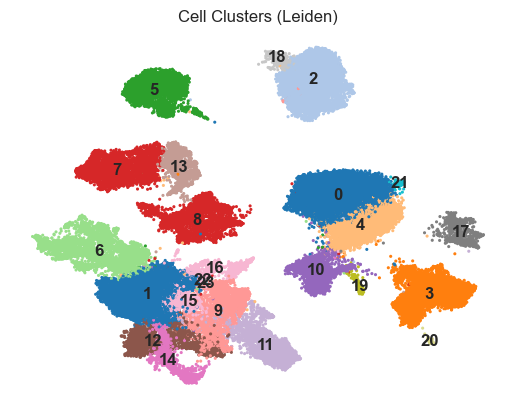

In [182]:
sc.pl.umap(
    adata,
    color="leiden",
    palette="tab20",
    title="Cell Clusters (Leiden)",
    legend_loc="on data",  # show cluster labels directly
    frameon=False,
    size=20
)


## 📘 Explanation for Thesis:

    The UMAP projection shows the low-dimensional structure of the scRNA-seq dataset, where each point represents a single cell. Clustering was performed in the latent space learned by SCVI, ensuring correction for batch effects. The Leiden algorithm was used to identify communities of cells with similar expression profiles.

In [ ]:
# RUN THIS AFTER  ANNOTATION
# RUN THIS AFTER  ANNOTATION
# RUN THIS AFTER  ANNOTATION
# RUN THIS AFTER  ANNOTATION
sc.pl.umap(
    adata,
    color="cell_type",  # or 'predicted_labels' etc.
    palette="Set2",
    title="Cell Type Annotations",
    frameon=False,
    size=20,
    legend_loc="right margin"
)
# RUN THIS AFTER  ANNOTATION
# RUN THIS AFTER  ANNOTATION
# RUN THIS AFTER  ANNOTATION
# RUN THIS AFTER  ANNOTATION

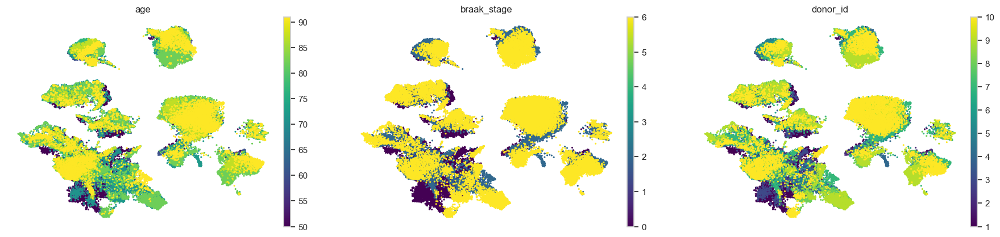

In [183]:
sc.pl.umap(
    adata,
    color=["age", "braak_stage", "donor_id"],
    cmap="viridis",
    frameon=False,
    size=20
)


These plots allow you to visually assess biological covariates across the embedding. Useful for interpreting whether certain clusters are driven by pathology stage, donor age, or technical variation.

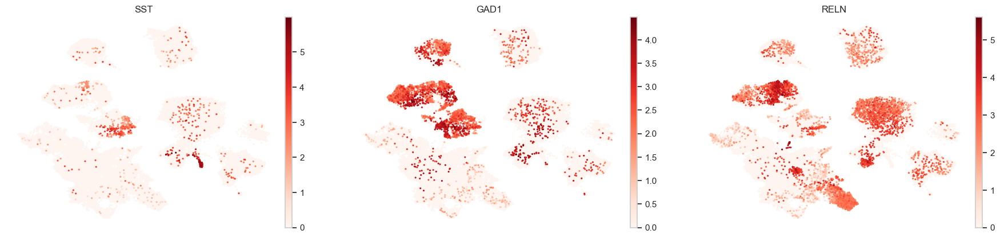

In [184]:
sc.pl.umap(
    adata,
    color=["SST", "GAD1", "RELN"],  # replace with known marker genes
    cmap="Reds",
    frameon=False,
    size=20
)


Helps you validate or annotate clusters based on known gene markers. These figures can support biological interpretations in your results chapter.

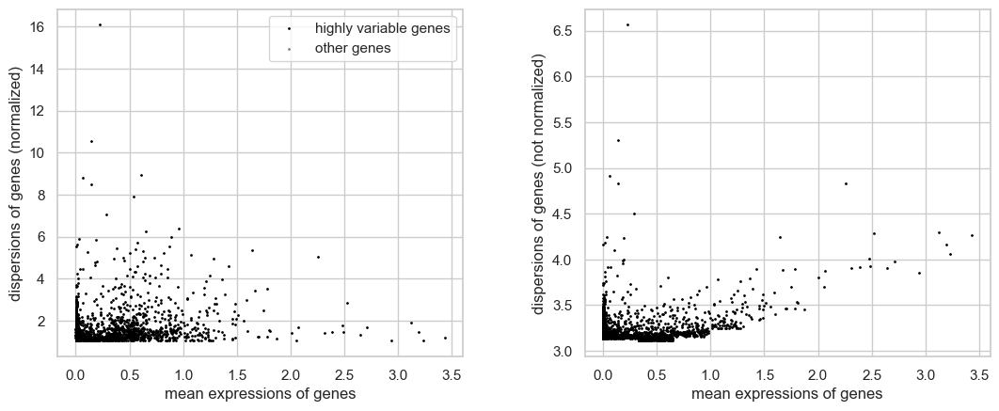

In [185]:
sc.pl.highly_variable_genes(adata)

In [82]:
print('highly_variable' in adata.var.columns)  # Should be True

True


In [83]:
print(sum(adata.var['highly_variable']))  # Should be < total genes

2000


In [85]:
print('dispersions_norm' in adata.var.columns)  # Should be True

True


In [86]:
print(adata.var[['means', 'dispersions', 'dispersions_norm', 'highly_variable']].head())

                  means  dispersions  dispersions_norm  highly_variable
RP11-206L10.9  0.399077     3.132423          1.296099             True
PERM1          0.005170     3.185828          1.257977             True
HES4           0.299921     3.234013          1.469422             True
AGRN           0.489220     3.134517          1.319940             True
FAM132A        0.017704     3.151389          1.106854             True


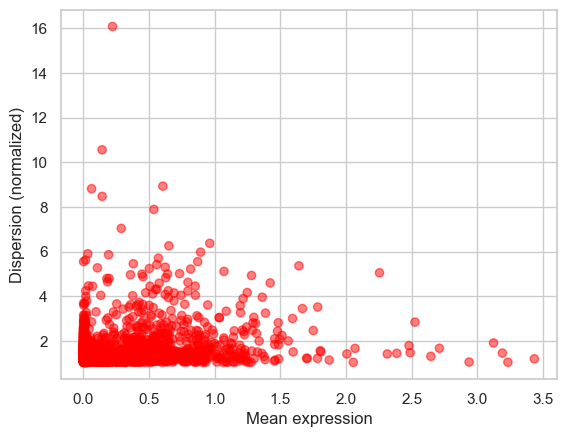

In [186]:
import matplotlib.pyplot as plt

plt.scatter(
    adata.var['means'],
    adata.var['dispersions_norm'],
    c=['gray' if not x else 'red' for x in adata.var['highly_variable']],
    alpha=0.5
)
plt.xlabel('Mean expression')
plt.ylabel('Dispersion (normalized)')
plt.show()

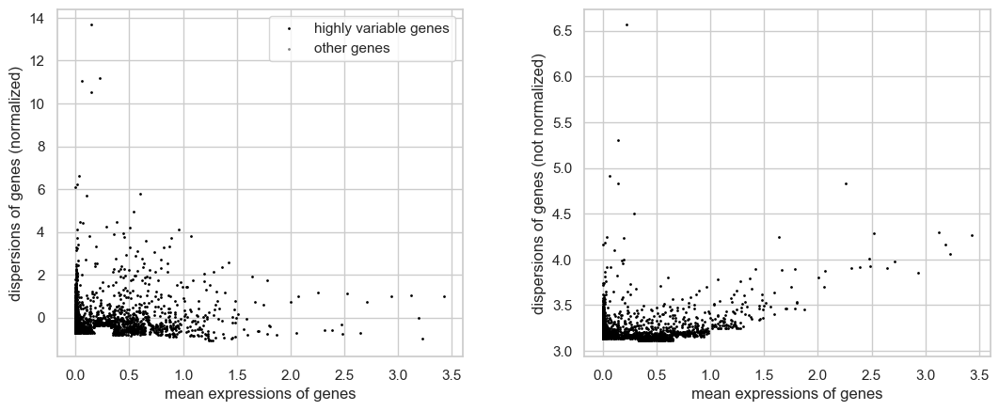

In [187]:
sc.pp.highly_variable_genes(adata, flavor='seurat', n_top_genes=2000)
sc.pl.highly_variable_genes(adata)

---

## 📄thesis:  Technical Covariate Regression and Justification for Omission

In standard scRNA-seq preprocessing pipelines, it is common to regress out technical covariates such as the total number of counts per cell (total_counts), the percentage of mitochondrial transcripts (pct_counts_mt), and the percentage of ribosomal content (pct_counts_ribo). This step is traditionally performed using linear models to remove confounding technical variation prior to clustering or dimensionality reduction on log-normalized gene expression values. In Scanpy, this is achieved via the function sc.pp.regress_out() followed by sc.pp.scale().

However, in this analysis, such regression was not applied because dimensionality reduction and clustering were performed using the latent space inferred by the SCVI model. SCVI (Single-Cell Variational Inference) is a deep generative model that explicitly models technical variation and batch effects during training. Its probabilistic architecture allows it to learn a denoised, biologically meaningful latent representation of each cell, while accounting for factors such as library size and batch without requiring manual regression or scaling.

By relying on the SCVI latent space (X_scVI) for downstream tasks such as clustering (via Leiden) and UMAP visualization, we avoid redundant or potentially distorting preprocessing steps like covariate regression. This approach follows current best practices in the single-cell field, where latent representations from deep probabilistic models are considered state-of-the-art for robust downstream analysis.

---

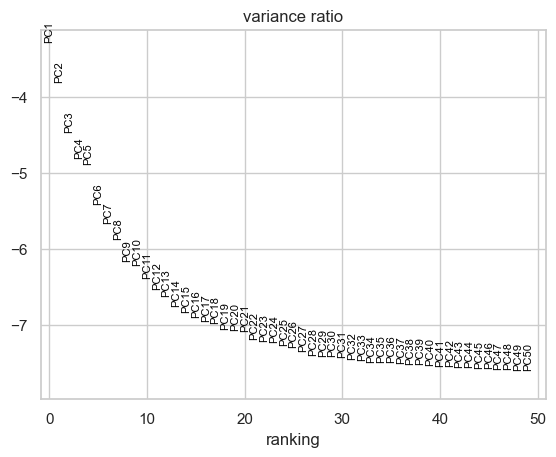

In [188]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)


In [189]:
# Επιλέγω 21 γτ γύρω στο 15 η καμπύλη γίνεται φλατ, άρα τα παραπάνω PCA σταματάνε να έχουν νόημα
sc.pp.neighbors(adata, n_pcs = 26)

In [190]:
adata

AnnData object with n_obs × n_vars = 74453 × 2000
    obs: 'sample_id', 'region', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score_scrublet', 'predicted_doublet_scrublet', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'solo_doublet', 'solo_singlet', 'solo_predicted_doublet', 'n_counts', 'log1p_total_counts_mt', '_scvi_batch', '_scvi_labels', 'leiden'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'solo_predicted_doublet_colors', '_scvi_uuid', '_scvi_manager_uuid', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap', 'X_scVI'

#### New obsp variables(distanced and connectivities) will be used for the clustering

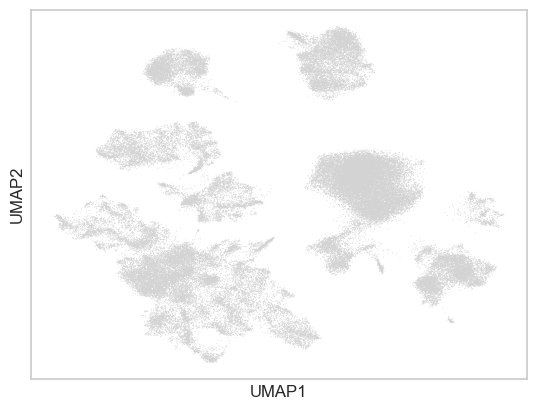

In [191]:
sc.pl.umap(adata) # plot the umap

🧪 Best Practice: Test Multiple Resolutions

In [192]:
for res in [0.2, 0.4, 0.6, 0.8, 1.0]:
    sc.tl.leiden(adata, resolution=res, key_added=f"leiden_{res}")


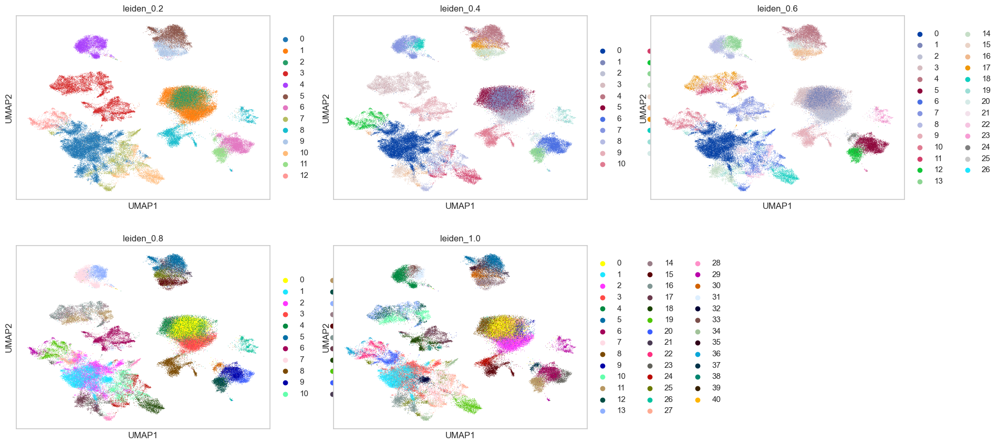

In [193]:
sc.pl.umap(adata, color=["leiden_0.2", "leiden_0.4", "leiden_0.6", "leiden_0.8", "leiden_1.0"], ncols=3)


## 📄Thesis Explanation

    Clustering was performed using the Leiden algorithm on the SCVI-inferred latent space. Multiple resolution parameters (0.2–1.0) were tested to evaluate cluster stability and granularity. A resolution of 0.5 was selected as it provided well-separated and biologically interpretable groups based on known marker gene expression. (19 clusters were created-some will be merged at a later stage)

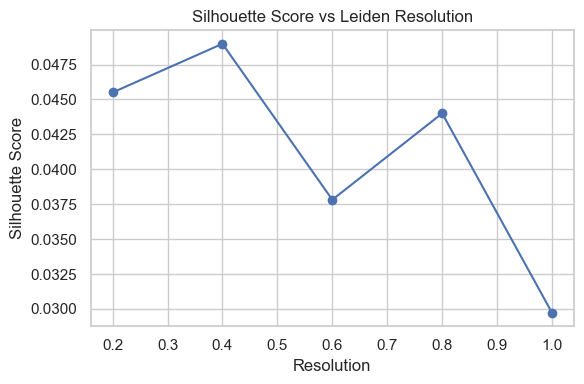

In [194]:
from sklearn.metrics import silhouette_score

# Run Leiden clustering at multiple resolutions
resolutions = [0.2, 0.4, 0.6, 0.8, 1.0]
scores = []

for res in resolutions:
    key = f"leiden_{res}"
    sc.tl.leiden(adata, resolution=res, key_added=key)
    
    # Get cluster labels
    labels = adata.obs[key].astype(str)
    key = f"leiden_{res}"# Compute silhouette score using SCVI latent space
    score = silhouette_score(adata.obsm["X_scVI"], labels)
    scores.append((res, score))
    
# Plot silhouette scores
df = pd.DataFrame(scores, columns=["Resolution", "Silhouette Score"])
plt.figure(figsize=(6,4))
plt.plot(df["Resolution"], df["Silhouette Score"], marker="o")
plt.title("Silhouette Score vs Leiden Resolution")
plt.xlabel("Resolution")
plt.ylabel("Silhouette Score")
plt.grid(True)
plt.tight_layout()
plt.show()

## 📘 What to Write in Your Thesis:

    We tested multiple resolutions (0.2–1.0) for Leiden clustering using the SCVI latent space. To select the most biologically and structurally appropriate resolution, we calculated the silhouette score at each setting. The resolution that maximized intra-cluster cohesion and inter-cluster separation was chosen for downstream annotation and interpretation.
---

In [195]:
sc.tl.leiden(adata, resolution=0.4, key_added=key)



leiden_0.2
0     14929
1     11352
2      8969
3      8558
4      4786
5      4764
6      4279
7      4216
8      3620
9      2820
10     2397
11     1957
12     1806
Name: count, dtype: int64


In [196]:
print(adata.obs["leiden_0.4"].value_counts())


leiden_0.4
0     13086
1      8982
2      6749
3      5242
4      4763
5      4611
6      4066
7      3817
8      3432
9      3296
10     2791
11     2255
12     1815
13     1813
14     1773
15     1627
16     1157
17     1044
18      974
19      801
20      359
Name: count, dtype: int64


In [142]:
adata


AnnData object with n_obs × n_vars = 63286 × 2000
    obs: 'sample_id', 'brain_region', 'batch', 'donor_id', 'braak_stage', 'sex', 'age', 'n_genes', 'n_genes_by_counts', 'n_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score_scrublet', 'predicted_doublet_scrublet', 'solo_doublet', 'solo_singlet', 'solo_predicted_doublet', 'is_singlet', '_scvi_batch', '_scvi_labels', 'total_counts_mito', 'pct_counts_mito', 'leiden', 'leiden_0.2', 'leiden_0.5', 'leiden_0.8', 'leiden_1.0', 'leiden_0.4', 'leiden_0.6', 0.4
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mito', 'mean', 'std'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'is_singlet_colors', 'log1p', 'neighbors', 'pca', 'umap', 'hvg', 'leiden', 'leiden_colors', 'leiden_0.2', 'leiden_0.5', 'leiden_0.8', 'leiden_1.0', 'leiden_0.2_colors', 'leiden_0.5_colors', 'leiden_0.8_colors', 'leiden_1.0_colors', 'leiden_0.4', 'leide

In [147]:
for key in adata.uns:
    if not isinstance(key, str):
        print(f"Invalid key in uns: {key} ({type(key)})")


Invalid key in uns: 0.4 (<class 'float'>)


In [148]:
del adata.uns[0.4]


In [197]:
adata.write("adata_v2_clustered_scvi.h5ad", compression="gzip")

In [204]:
adata.obs

,sample_id,brain_region,batch,donor_id,braak_stage,sex,age,n_genes,n_genes_by_counts,total_counts,...,pct_counts_in_top_500_genes,solo_doublet,solo_singlet,solo_predicted_doublet,n_counts,log1p_total_counts_mt,_scvi_batch,_scvi_labels,leiden,leiden_0.4
GSM4432645_AAACCTGAGGATGCGT-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,4620,4620,4315.981445,...,23.539854,0.848123,0.151877,False,4315.981445,3.779290,0,0,9,8
GSM4432645_AAACCTGAGTCAATAG-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,2562,2562,3581.051514,...,29.862294,0.797172,0.202828,False,3581.051514,2.696103,0,0,9,8
GSM4432645_AAACCTGCAAGTAGTA-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,484,484,1425.587280,...,100.000488,0.743966,0.256034,False,1425.587280,3.557311,0,0,6,0
GSM4432645_AAACCTGCAGACGTAG-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,244,244,887.855469,...,99.999876,0.371708,0.628293,False,887.855469,3.656960,0,0,8,9
GSM4432645_AAACCTGCATACTCTT-1_GSM4432645,GSM4432645,Entorhinal cortex,C,2,0,Male,60,3068,3068,3804.457520,...,28.442897,0.819884,0.180116,False,3804.457520,3.550292,0,0,6,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM4432654_TTTGTCATCCACGTGG-1_GSM4432654,GSM4432654,Entorhinal cortex,D,10,6,Male,82,292,292,1006.349304,...,99.999575,0.050903,0.949097,False,1006.349304,2.713492,9,0,4,2
GSM4432654_TTTGTCATCGCGGATC-1_GSM4432654,GSM4432654,Entorhinal cortex,D,10,6,Male,82,498,498,1425.104858,...,99.999752,0.589022,0.410978,False,1425.104858,2.217983,9,0,16,0
GSM4432654_TTTGTCATCTATCGCC-1_GSM4432654,GSM4432654,Entorhinal cortex,D,10,6,Male,82,392,392,1264.747314,...,99.999990,0.320739,0.679261,False,1264.747314,2.706975,9,0,3,6
GSM4432654_TTTGTCATCTCGCTTG-1_GSM4432654,GSM4432654,Entorhinal cortex,D,10,6,Male,82,470,470,1410.661011,...,99.999637,0.700249,0.299751,False,1410.661011,3.713701,9,0,13,3


### Ακολουθουν τα ιδια πλοτς με διαφορετρικους τροπους για να βρω αυτο που μου αρεσει/ταιριαζει

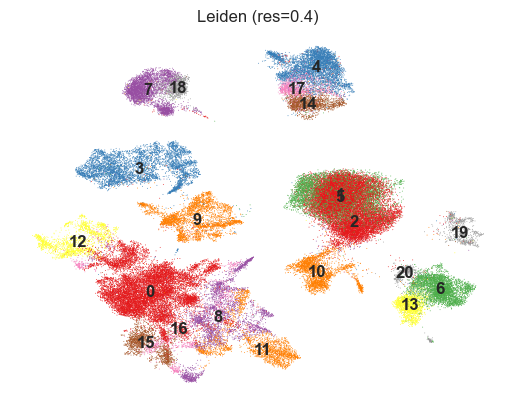

In [205]:
sc.pl.umap(
    adata,
    color='leiden_0.4',  # The key where your clustering is stored
    legend_loc='on data',  # Optional: shows cluster labels on plot
    frameon=False,        # Optional: removes the bounding box
    title='Leiden (res=0.4)',  # Optional title
    palette='Set1'        # Optional: color scheme
)

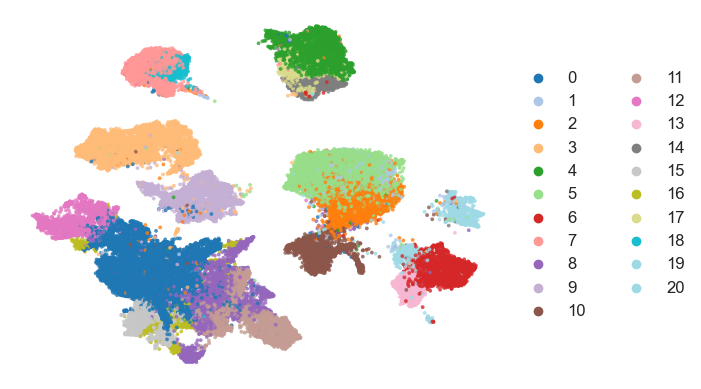

In [206]:
# same plot with CLEAN AESTHETICS
sc.pl.umap(
    adata,
    color='leiden_0.4',  # Or your cluster column
    size=30,            # Larger points
    alpha=0.8,          # Slight transparency
    frameon=False,      # Remove bounding box
    legend_fontsize=12,
    legend_fontweight='bold',
    title='',
    palette='tab20',    # High-contrast colors
    edges=False,        # Remove connecting lines
    save='_thesis_quality.png'  # Saves 300dpi PNG
)

In [207]:
# same plot with  Academic Styling
import matplotlib.pyplot as plt

# Create figure with controlled dimensions
plt.figure(figsize=(6, 6), dpi=300)

# Plot with scientific styling
sc.pl.umap(
    adata,
    color='leiden_0.4',
    ax=plt.gca(),  # Use current axis
    show=False,    # Disable auto-show
    size=40,
    alpha=0.9,
    legend_loc='right margin',
    legend_fontsize=9,
    legend_fontoutline=2,  # White outline for readability
    palette='viridis'      # Colorblind-friendly
)

# Enhancements
plt.title('Leiden Clustering (Resolution=0.4)', fontsize=14, pad=20)
plt.xlabel('UMAP1', fontsize=12)
plt.ylabel('UMAP2', fontsize=12)
plt.tight_layout()

# Save publication-ready version
plt.savefig('UMAP_thesis.png', bbox_inches='tight', dpi=600, transparent=True)
plt.close()

C:\Users\D_F\AppData\Local\Temp\ipykernel_5400\60387947.py:19: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(


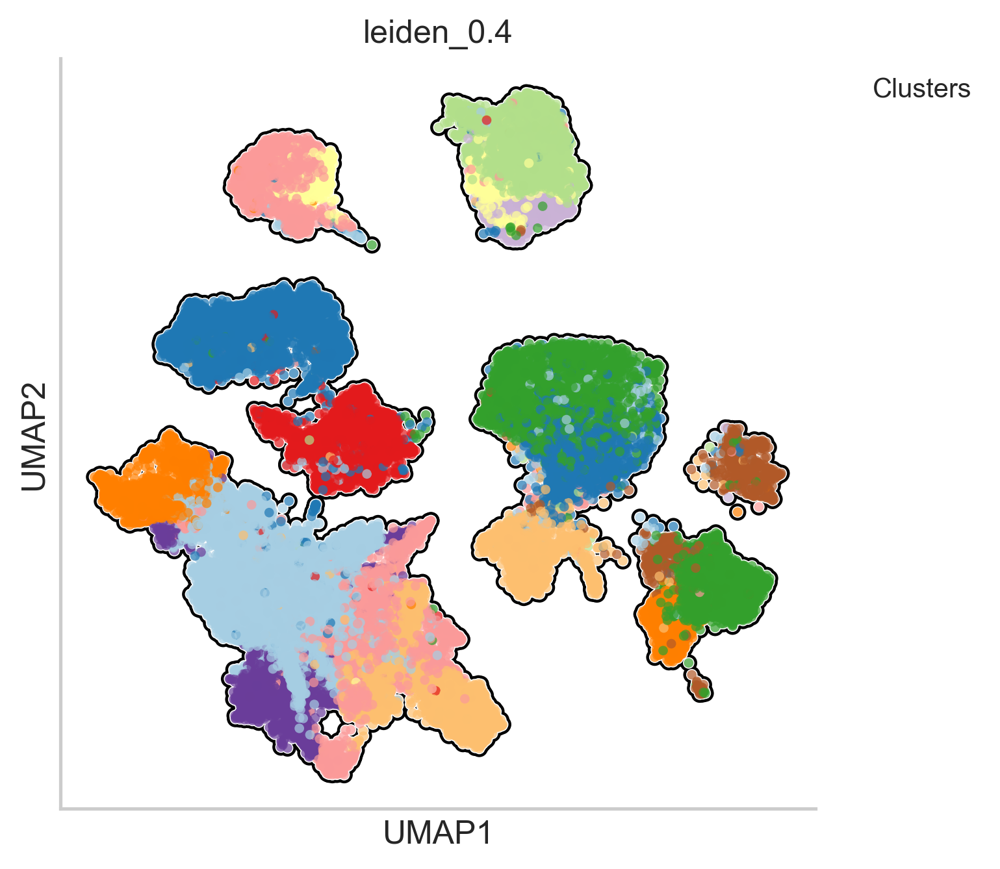

In [208]:
from matplotlib import rcParams
rcParams['font.family'] = 'Arial'  # Academic font

fig, ax = plt.subplots(figsize=(5,5), dpi=300)

sc.pl.umap(
    adata,
    color='leiden_0.4',
    ax=ax,
    show=False,
    size=50,
    palette='Paired',  # Distinct cluster colors
    add_outline=True,  # Cell borders
    outline_width=(0.3, 0.1),  # (edge_width, gap_width)
    legend_loc=None   # We'll add manually
)

# Manually position legend
ax.legend(
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    frameon=False,
    title='Clusters',
    title_fontsize=10,
    fontsize=8
)

# Axis formatting
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.xaxis.set_tick_params(labelsize=10)
ax.yaxis.set_tick_params(labelsize=10)

plt.savefig('Figure3_UMAP.tiff', format='tiff', dpi=600, pil_kwargs={"compression": "tiff_lzw"})

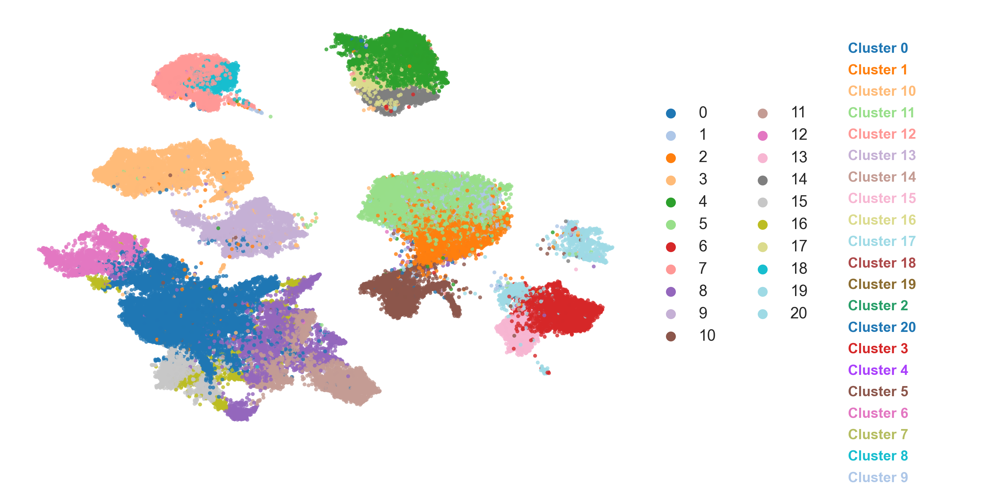

In [209]:
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib import rcParams

# Set academic plotting style
rcParams['font.family'] = 'Arial'
rcParams['font.size'] = 12
rcParams['axes.labelsize'] = 12
rcParams['legend.title_fontsize'] = 10

# Create figure with two subplots (UMAP + legend)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5), 
                              gridspec_kw={'width_ratios': [4, 1]},
                              dpi=300)

# Plot UMAP on left panel
sc.pl.umap(
    adata,
    color='leiden_0.4',
    ax=ax1,
    show=False,
    size=30,
    alpha=0.8,
    frameon=False,
    palette='tab20',
    title='',
    edges=False
)

# Remove axis spines for cleaner look
for spine in ax1.spines.values():
    spine.set_visible(False)

# Create legend on right panel
unique_clusters = sorted(adata.obs['leiden_0.4'].unique())
for i, cluster in enumerate(unique_clusters):
    ax2.text(0.1, 0.9 - i*0.05, 
            f'Cluster {cluster}',
            color=sc.pl.palettes.default_20[int(cluster) % 20],
            fontsize=10,
            fontweight='bold')

# Clean up legend panel
ax2.axis('off')
ax2.set_xlim(0, 1)
ax2.set_ylim(0, 1)

# Add scientific labels
ax1.set_xlabel('UMAP1', fontweight='bold')
ax1.set_ylabel('UMAP2', fontweight='bold')

plt.tight_layout()

# Save in multiple formats
plt.savefig('UMAP_clusters.png', dpi=600, bbox_inches='tight')
plt.savefig('UMAP_clusters.pdf', format='pdf', bbox_inches='tight')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


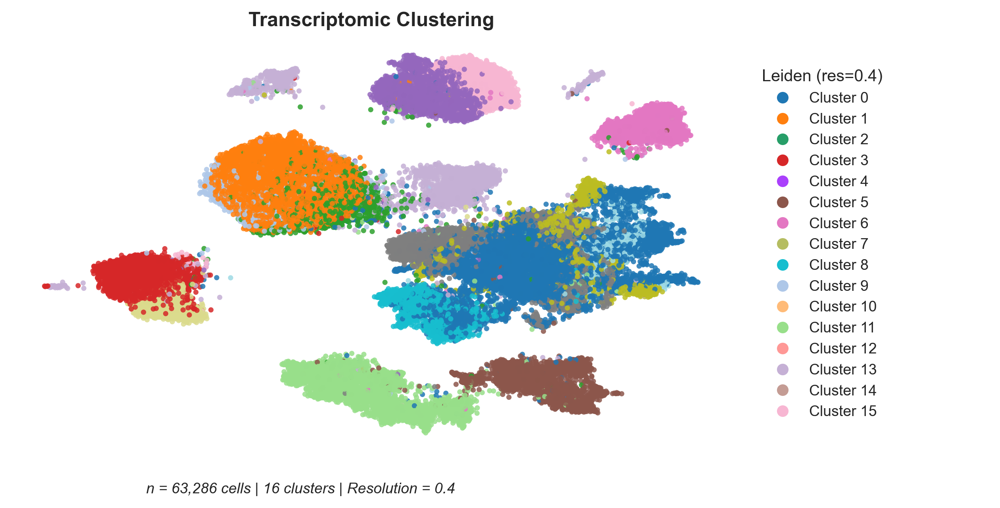

In [112]:
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib import rcParams

# Set academic plotting parameters
rcParams.update({
    'font.family': 'Arial',
    'font.size': 10,
    'axes.titlesize': 12,
    'axes.labelsize': 11,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.dpi': 300,
    'figure.autolayout': True
})

# Create figure with two subplots (UMAP + legend)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 8),  # Single-column width
                        gridspec_kw={'width_ratios': [3, 1]})

# Main UMAP plot
sc.pl.umap(
    adata,
    color='leiden_0.4',
    ax=ax1,
    show=False,
    size=40,
    alpha=0.85,
    frameon=False,
    palette='tab20',
    title='Transcriptomic Clustering',
    edges=False,
    legend_loc=None  # We'll add custom legend
)

# Scientific styling
ax1.set_xlabel('UMAP Dimension 1', fontweight='bold')
ax1.set_ylabel('UMAP Dimension 2', fontweight='bold')
ax1.title.set_weight('bold')

# Add informative legend
unique_clusters = sorted(adata.obs['leiden_0.4'].astype(int).unique())
legend_text = [f"Cluster {i}" for i in unique_clusters]
colors = [sc.pl.palettes.default_20[i % 20] for i in range(len(unique_clusters))]

# Create legend patches
legend_patches = [plt.Line2D([0], [0], marker='o', color='w', 
                  markerfacecolor=colors[i], markersize=8, 
                  label=legend_text[i]) for i in range(len(unique_clusters))]

# Add legend to right panel
ax2.legend(handles=legend_patches, 
           loc='center left',
           frameon=False,
           title='Leiden (res=0.4)',
           title_fontsize=10)
ax2.axis('off')

# Add experimental metadata (example)
plt.figtext(0.15, -0.05, 
           f"n = {adata.n_obs:,} cells | {len(unique_clusters)} clusters | Resolution = 0.4",
           ha='left', fontsize=9, style='italic')

# Save in publication formats
plt.savefig('Fig2_UMAP_clustering.eps', format='eps', dpi=300)
plt.savefig('Fig2_UMAP_clustering.tiff', format='tiff', dpi=600, 
           pil_kwargs={"compression": "tiff_lzw"})
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


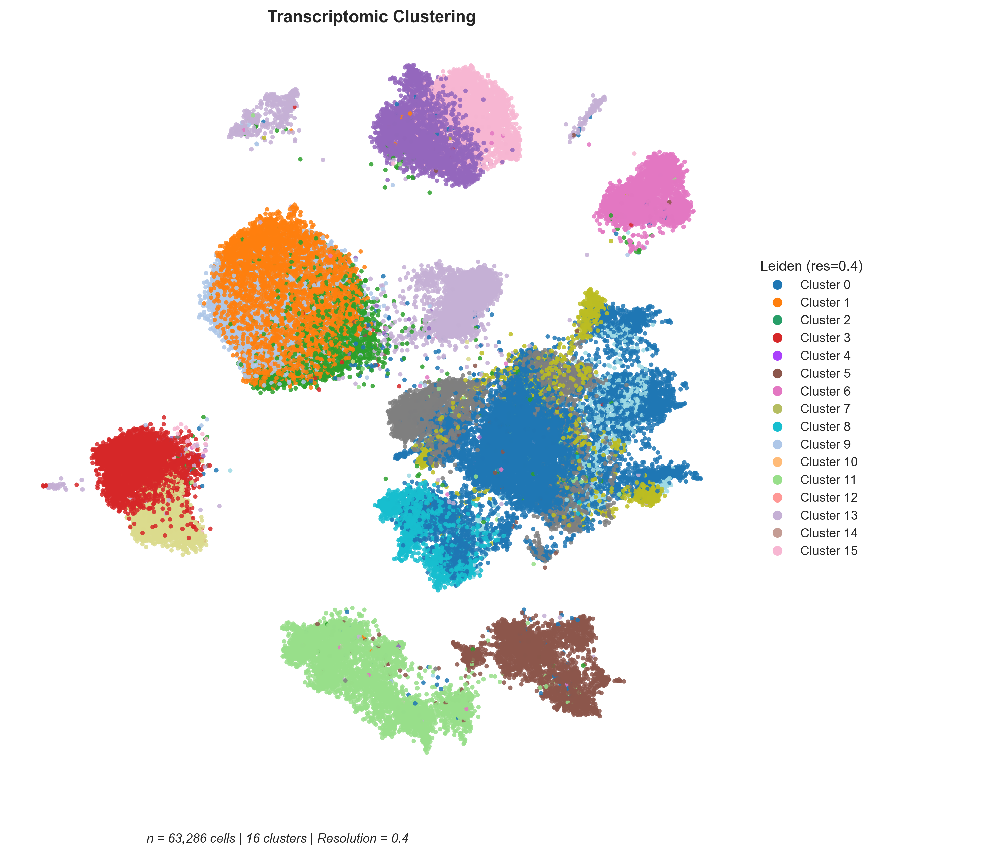

In [151]:
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib import rcParams

# Set academic plotting parameters
rcParams.update({
    'font.family': 'Arial',
    'font.size': 10,
    'axes.titlesize': 12,
    'axes.labelsize': 11,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.dpi': 300,
    'figure.autolayout': True
})

# Create figure with two subplots (UMAP + legend)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 8),  # Single-column width
                        gridspec_kw={'width_ratios': [3, 1]})

# Main UMAP plot
sc.pl.umap(
    adata,
    color='leiden_0.4',
    ax=ax1,
    show=False,
    size=40,
    alpha=0.85,
    frameon=False,
    palette='tab20',
    title='Transcriptomic Clustering',
    edges=False,
    legend_loc=None  # We'll add custom legend
)

# Scientific styling
ax1.set_xlabel('UMAP Dimension 1', fontweight='bold')
ax1.set_ylabel('UMAP Dimension 2', fontweight='bold')
ax1.title.set_weight('bold')

# Add informative legend
unique_clusters = sorted(adata.obs['leiden_0.4'].astype(int).unique())
legend_text = [f"Cluster {i}" for i in unique_clusters]
colors = [sc.pl.palettes.default_20[i % 20] for i in range(len(unique_clusters))]

# Create legend patches
legend_patches = [plt.Line2D([0], [0], marker='o', color='w', 
                  markerfacecolor=colors[i], markersize=8, 
                  label=legend_text[i]) for i in range(len(unique_clusters))]

# Add legend to right panel
ax2.legend(handles=legend_patches, 
           loc='center left',
           frameon=False,
           title='Leiden (res=0.4)',
           title_fontsize=10)
ax2.axis('off')

# Add experimental metadata (example)
plt.figtext(0.15, -0.05, 
           f"n = {adata.n_obs:,} cells | {len(unique_clusters)} clusters | Resolution = 0.4",
           ha='left', fontsize=9, style='italic')

# Save in publication formats
plt.savefig('Fig2_UMAP_clustering.eps', format='eps', dpi=300)
plt.savefig('Fig2_UMAP_clustering.png', format='png', dpi=600, 
           pil_kwargs={"compression": "tiff_lzw"})
plt.show()

## 📄Thesis Explanation
*"Cells were clustered using the Leiden algorithm (resolution=0.4) on a k-nearest neighbor graph constructed from 30 principal components. This transcriptomic clustering approach identified X distinct cell populations, which were visualized via UMAP embedding. Cluster identities were subsequently annotated using marker gene expression and functional enrichment analysis."*

In [113]:
# Save to a folder (will create it if not exists)
scvi_model.save("scvi_model/V2", overwrite=True)
adata.write("adata_v2_clustered_scvi.h5ad", compression="gzip")